[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](
https://colab.research.google.com/github/Nishani53/Khanal_MSc_Thesis_MSU/blob/main/Forest%20Cover%20Calculation/Forest%20Coverage%20Analysis.ipynb
)





# 🌲 Forest Market Coverage & Forest Area Overlay Analysis

This repository contains scripts and data for quantifying **forest area** within **procurement zones** of biomass, hardwood, softwood, and pulpwood markets in Michigan, across multiple decades.  
It also identifies how much forest land was **retained**, **lost**, or **newly added** to market coverage between years, broken down by **forest type**.

---

## 📌 Objective

To accurately measure forestland within market coverage zones for:

- 🌳 **Hardwood Sawlogs**
- 🌲 **Softwood Sawlogs**
- 🧻 **Pulpwood**
- 🔥 **Biomass**

The workflow overlays **market coverage shapefiles** with **forest cover and forest type rasters** to calculate area (in acres) by forest group and track temporal changes.

---

## 🗺️ Data Sources

### 1. **Market Coverage Shapefiles**
- Represent procurement zones for different products and years.
- Contain a `status` field with:
  - **Market Retain** – areas present in both time periods
  - **Market Loss** – areas present in earlier period only
  - **Market Add** – areas new in the later period

### 2. **Competition Class Hotspot Maps**
- Dissolved polygons showing overlapping procurement zones.
- Classified into:
  - `1 - Lowest`
  - `2 - Low`
  - `3 - Medium`
  - `4 - High`

### 3. **Forest Cover & Forest Type Rasters**
- **NLCD Land Cover** (2001, 2019) – identifies forest/non-forest pixels.
- **FIA Forest Type Groups** – classifies forest by species group.
- ~30m resolution.

---

## 🧠 Method Overview

1. **Reprojection** – All shapefiles reprojected to raster CRS.
2. **Raster Clipping** – Each polygon masks the raster to extract only relevant pixels.
3. **Filtering** – Select only valid forest classes or forest type groups.
4. **Area Calculation** – Count pixels × pixel area (m²) → acres.
5. **Summarization** – Report total forest area and breakdown by forest type.

---

## 🛠️ Python Libraries Used

- [`geopandas`](https://geopandas.org/) – vector data handling
- [`matplotlib`](https://matplotlib.org/) – mapping and visualization
- [`rasterio`](https://rasterio.readthedocs.io/) – raster I/O and masking
- [`fiona`](https://fiona.readthedocs.io/) – shapefile I/O
- [`shapely`](https://shapely.readthedocs.io/) – geometry operations
- [`pyproj`](https://pyproj4.github.io/pyproj/stable/) – coordinate transformations
- [`numpy`](https://numpy.org/) – pixel counting and calculations

---

## 📈 Output Examples

For each polygon:
- **Total forest area** (acres)
- **Forest area by type group** (acres)
- Side-by-side plots of **undissolved** (competition classes) vs. **dissolved** (full coverage)

Example change classification visualization:

| Status         | Color      |
|----------------|------------|
| Market Retain  | Light Gray |
| Market Loss    | Red        |
| Market Add     | Blue       |

---

## 📂 Repository Structure

```
Data/
    biomass_coverage_*.shp
    biomass_change_*-*.shp
    hardwood_coverage_*.shp
    hardwood_change_*-*.shp
    softwood_coverage_*.shp
    softwood_change_*-*.shp
    pulpwood_coverage_*.shp
    pulpwood_change_*-*.shp
    *_hotspots_*.shp
    Counties_(v17a).shp
    forest_cover_2019.tif
    lulc2001.tif
Scripts/
    01_generate_change_shapefiles.py
    02_visualize_changes.py
    03_forest_cover_area_calculation.py
    04_forest_type_area_calculation.py
Outputs/
    Plots/
    Tables/
README.md
```

---

## 🚀 Usage

**Run in Colab:**  
Click the badge at the top to open the main notebook in Google Colab with all dependencies pre-installed.

**Local Execution:**  
1. Clone the repository:
```bash
git clone https://github.com/Nishani53/Khanal_MSc_Thesis_MSU.git
```
2. Install dependencies:
```bash
pip install geopandas matplotlib rasterio fiona shapely pyproj numpy
```
3. Run analysis scripts from the `Scripts` folder.

---

## 📅 Time Periods Analyzed
- **1985–1994**
- **1994–2002**
- **2002–2018**
- **2018–2023**
- **1985–2023** (long-term change)

---

## 📜 License
This repository is for academic research. Please contact the author before reuse or redistribution.


In [1]:
!pip install rasterio geopandas shapely
!pip install geopandas fiona
!pip install matplotlib-scalebar
!pip install gdown
!pip install pydrive
!pip install matplotlib-scalebar


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 46.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.2/17.2 MB 62.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 987.4/987.4 kB 12.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pydrive: filename=PyDrive-1.3.1-py3-none-any.whl size=27433 sha256=91203fb48a98c3272a9be3b3e42a3e920784df7315b8a04fed12ab68afad88e3
  Stored in directory: /root/.cache/pip/wheels/6c/10/da/a5b513f5b3916fc391c20ee7b4633e5cf3396d570cdd74970f
Successfully built pydrive


In [2]:
# 📁 Step 1: Clean Colab working directory
%cd /content
!rm -rf sample_data/ repo.zip Khanal_MSc_Thesis_MSU-main "Khanal Thesis Data.7z"

# 🛠️ Step 2: Install 7-Zip
!apt-get install -y p7zip-full

# 📥 Step 3: Download your GitHub repo (main branch as zip)
!curl -L -o repo.zip https://github.com/Nishani53/Khanal_MSc_Thesis_MSU/archive/refs/heads/main.zip
!unzip -q repo.zip

# 📂 Step 4: Navigate to the Data folder
%cd "Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data"

# 📥 Step 5: Download the 7z file (if you want a fresh copy from GitHub)
!curl -L -o "Khanal Thesis Data.7z" "https://github.com/Nishani53/Khanal_MSc_Thesis_MSU/raw/main/Forest%20Cover%20Calculation/Data/Khanal%20Thesis%20Data.7z"

# 📂 Step 6: Extract the .7z file (contains Data folder with actual files)
!7z x -y "Khanal Thesis Data.7z"

# 📂 Step 7: Set base path to extracted Data folder
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Data"

import os

print("📁 Listing all files in extracted Data folder:\n")
for root, dirs, files in os.walk(base_path):
    for file in files:
        print(os.path.join(root, file))


/content
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
p7zip-full is already the newest version (16.02+dfsg-8).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 40.8M    0 40.8M    0     0  12.3M      0 --:--:--  0:00:03 --:--:-- 18.8M
/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 64.8M  100 64.8M    0     0  39.2M      0  0:00:01  0:00:01 --:--:--  108M

7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip 

In [3]:
import os

# 🔹 Adjust this to your top-level extracted directory
data_root = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data"

# Common raster extensions
raster_ext = {".tif", ".tiff", ".img", ".asc", ".vrt"}

shp_files = []
raster_files = []

for root, dirs, files in os.walk(data_root):
    for f in files:
        ext = os.path.splitext(f)[1].lower()
        if ext == ".shp":
            shp_files.append(os.path.join(root, f))
        elif ext in raster_ext:
            raster_files.append(os.path.join(root, f))

print("📂 Shapefiles:\n", *shp_files, sep="\n")
print("\n🗺️ Raster files:\n", *raster_files, sep="\n")


📂 Shapefiles:

/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data/Biomass_1994_hotspots.shp
/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data/Pulpwood_2002_coverage.shp
/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data/Pulpwood_1994_hotspots.shp
/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data/Pulpwood_1985-1994_change.shp
/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data/Hardwood_2002_hotspots.shp
/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data/Hardwood_2023_coverage.shp
/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data/Hardwood_1985_coverage.shp
/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data/Biomass_1985-2023_change.shp
/content/Khanal_MSc_Thesis_MSU-main/Forest Co

# Forest Coverage Area for Market Added, Lost, and Retained
Later in this analysis, there will be forest coverage for different competition class for different forest Products.

# Biomass

# 1985-1994

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


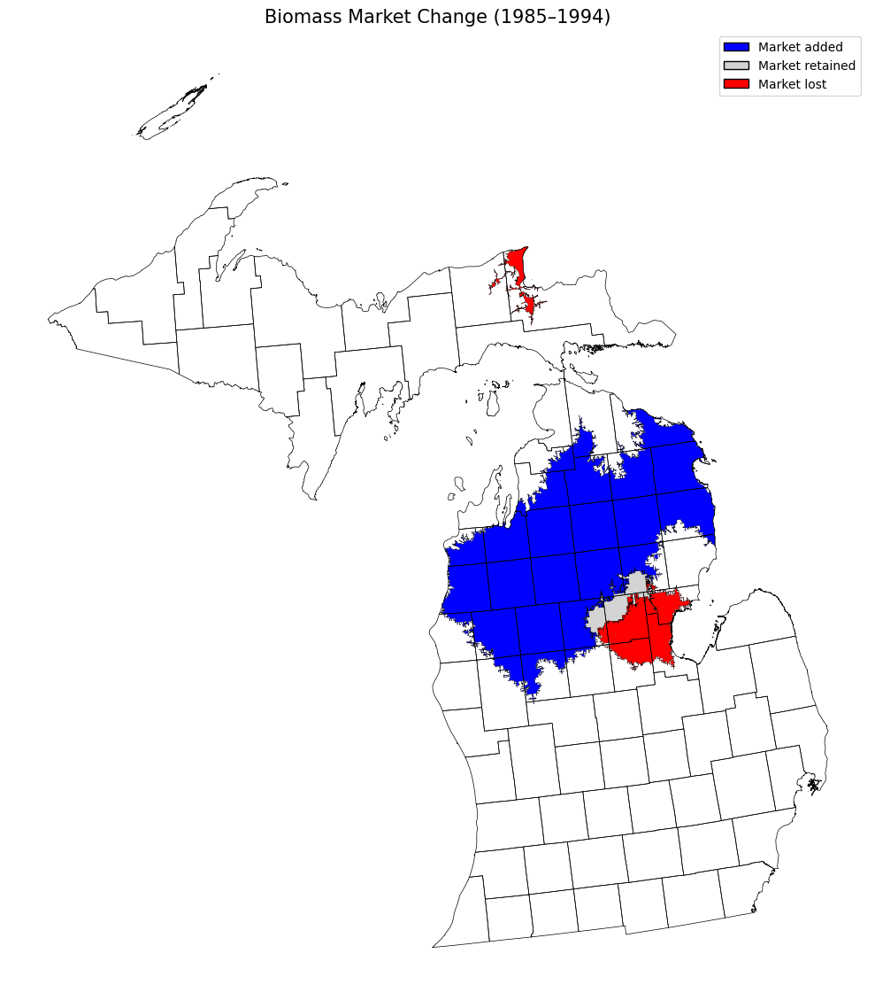

In [5]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the actual folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Biomass_1985-1994_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (1985–1994)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


# Using 2001 Forest Cover Data

In [6]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Biomass_1985-1994_change.shp")  # Updated shapefile

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' has a forest area of 123,487.66 acres.
Polygon 'Market added' has a forest area of 3,932,068.86 acres.
Polygon 'Market lost' has a forest area of 246,285.01 acres.


# Using 2019 Forest Cover Data

In [7]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "Biomass_1985-1994_change.shp")  # Updated shapefile

# --- Forest group code mapping ---
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# --- Open raster and shapefile ---
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        # Function to reproject geometry if CRS differs
        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        # --- Loop through polygons ---
        for feature in shapefile:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if needed
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            # Mask nodata
            valid_data = out_data[out_data != nodata] if nodata is not None else out_data

            # Calculate forest type areas
            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)
            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market retained' has a forest area of 154255.30 acres.
   White/Red/Jack Pine Group: 13390.00 acres
   Spruce/Fir Group: 2888.04 acres
   Aspen/Birch Group: 137977.25 acres

Polygon 'Market added' has a forest area of 4620014.08 acres.
   White/Red/Jack Pine Group: 1162366.48 acres
   Spruce/Fir Group: 413283.11 acres
   Elm/Ash/Cottonwood Group: 1281.86 acres
   Aspen/Birch Group: 3043082.63 acres

Polygon 'Market lost' has a forest area of 424866.16 acres.
   White/Red/Jack Pine Group: 58255.00 acres
   Spruce/Fir Group: 29359.16 acres
   Oak/Hickory Group: 92.66 acres
   Aspen/Birch Group: 337159.33 acres



# 1994-2002

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


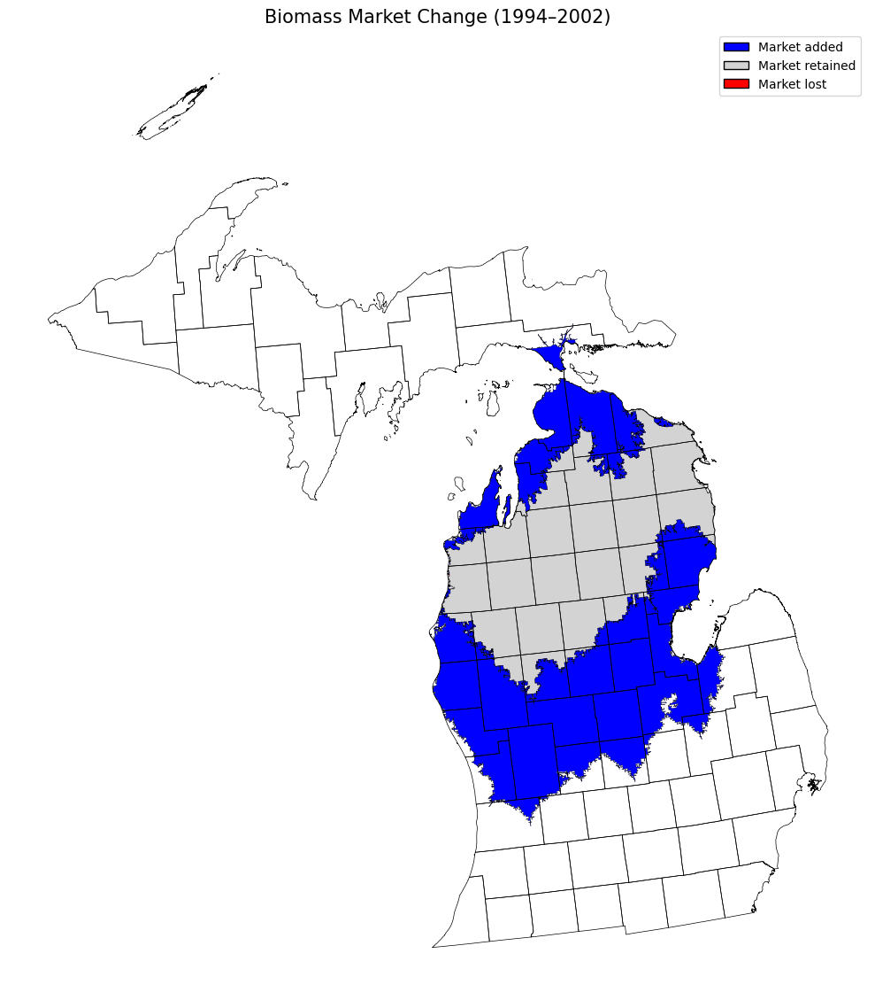

In [8]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Biomass_1994-2002_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (1994–2002)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


# Using 2001 Data

In [9]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Biomass_1994-2002_change.shp")  # Updated shapefile for 1994–2002

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (1994–2002) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (1994–2002) has a forest area of 4,055,187.35 acres.
Polygon 'Market added' (1994–2002) has a forest area of 2,808,820.96 acres.
Polygon 'Market lost' (1994–2002) has a forest area of 369.17 acres.


# Using 2019 Forest Cover Data

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1994-2002.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 7579220.00 acres.
   White/Red/Jack Pine Group: 1633039.72 acres
   Spruce/Fir Group: 666210.52 acres
   Oak/Hickory Group: 942.09 acres
   Elm/Ash/Cottonwood Group: 1559.85 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 5277375.15 acres

Polygon 'Market Loss' has a forest area of 447182.83 acres.
   White/Red/Jack Pine Group: 37065.75 acres
   Spruce/Fir Group: 83861.26 acres
   Oak/Hickory Group: 108.11 acres
   Aspen/Birch Group: 326147.71 acres

Polygon 'Market Add' has a forest area of 30.89 acres.
   Aspen/Birch Group: 30.89 acres



# 2002-2018

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


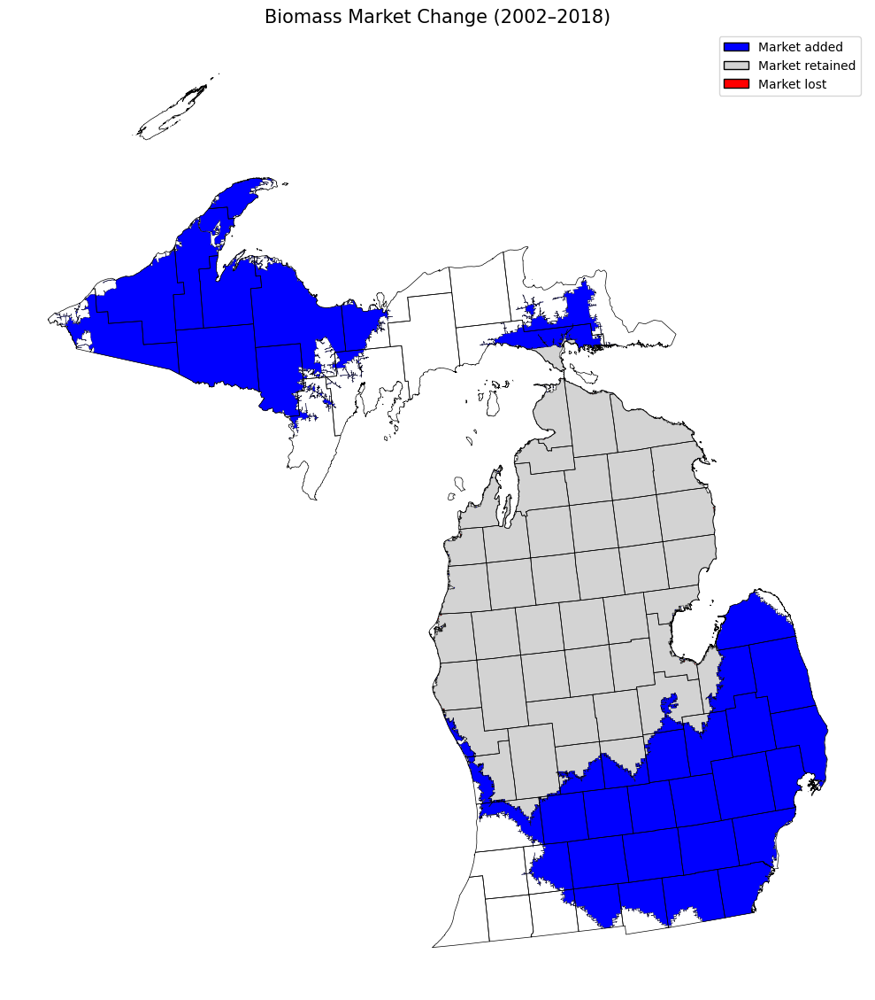

In [10]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Biomass_2002-2018_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (2002–2018)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


# Using 2001 Map

In [11]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Biomass_2002-2018_change.shp")  # Updated shapefile for 2002–2018

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (2002–2018) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (2002–2018) has a forest area of 6,862,542.73 acres.
Polygon 'Market added' (2002–2018) has a forest area of 6,128,987.82 acres.
Polygon 'Market lost' (2002–2018) has a forest area of 1,465.58 acres.


# Using 2019 Forest Cover Map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2002-2018.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 7579142.78 acres.
   White/Red/Jack Pine Group: 1632993.39 acres
   Spruce/Fir Group: 666179.64 acres
   Oak/Hickory Group: 942.09 acres
   Elm/Ash/Cottonwood Group: 1559.85 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 5277375.15 acres

Polygon 'Market Loss' has a forest area of 108.11 acres.
   White/Red/Jack Pine Group: 46.33 acres
   Spruce/Fir Group: 30.89 acres
   Aspen/Birch Group: 30.89 acres

Polygon 'Market Add' has a forest area of 7769073.86 acres.
   White/Red/Jack Pine Group: 364726.98 acres
   Spruce/Fir Group: 1209100.21 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 74672.04 acres
   Elm/Ash/Cottonwood Group: 100031.19 acres
   Maple/Beech/Birch Group: 3425616.62 acres
   Aspen/Birch Group: 2594787.83 acres



# 2018-2023

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


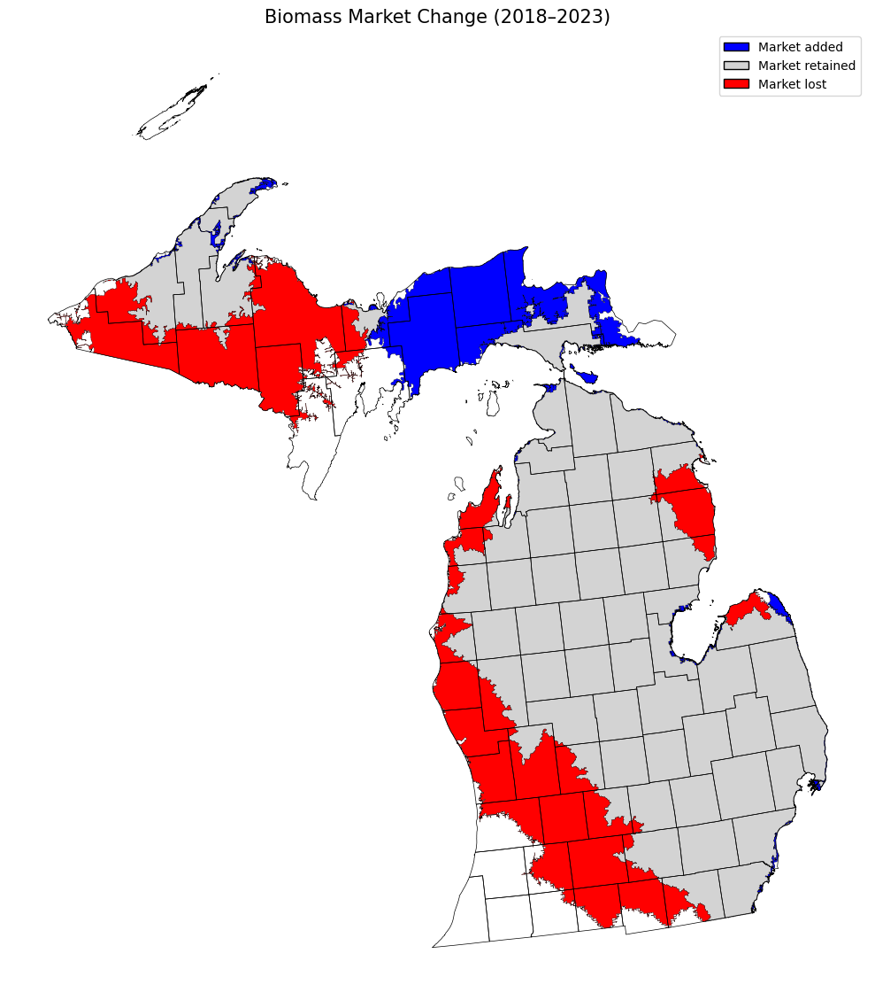

In [12]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Biomass_2018-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (2018–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


# Using 2001 Map

In [13]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Biomass_2018-2023_change.shp")  # Updated shapefile for 2018–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (2018–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (2018–2023) has a forest area of 9,089,396.21 acres.
Polygon 'Market added' (2018–2023) has a forest area of 1,390,559.42 acres.
Polygon 'Market lost' (2018–2023) has a forest area of 3,902,134.34 acres.


#Using 2019


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2018-2023.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 12872950.42 acres.
   White/Red/Jack Pine Group: 1844268.17 acres
   Spruce/Fir Group: 1429208.99 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 25930.58 acres
   Elm/Ash/Cottonwood Group: 32494.31 acres
   Maple/Beech/Birch Group: 2366431.92 acres
   Aspen/Birch Group: 7174477.46 acres

Polygon 'Market Loss' has a forest area of 2475266.23 acres.
   White/Red/Jack Pine Group: 153452.21 acres
   Spruce/Fir Group: 446070.86 acres
   Oak/Hickory Group: 49683.55 acres
   Elm/Ash/Cottonwood Group: 69096.74 acres
   Maple/Beech/Birch Group: 1059277.36 acres
   Aspen/Birch Group: 697685.52 acres

Polygon 'Market Add' has a forest area of 2246338.89 acres.
   White/Red/Jack Pine Group: 414317.86 acres
   Spruce/Fir Group: 916651.44 acres
   Oak/Hickory Group: 5034.76 acres
   Elm/Ash/Cottonwood Group: 8355.24 acres
   Maple/Beech/Birch Group: 216124.21 acres
   Aspen/Birch Group: 685855.37 acres



# 1985-2023

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


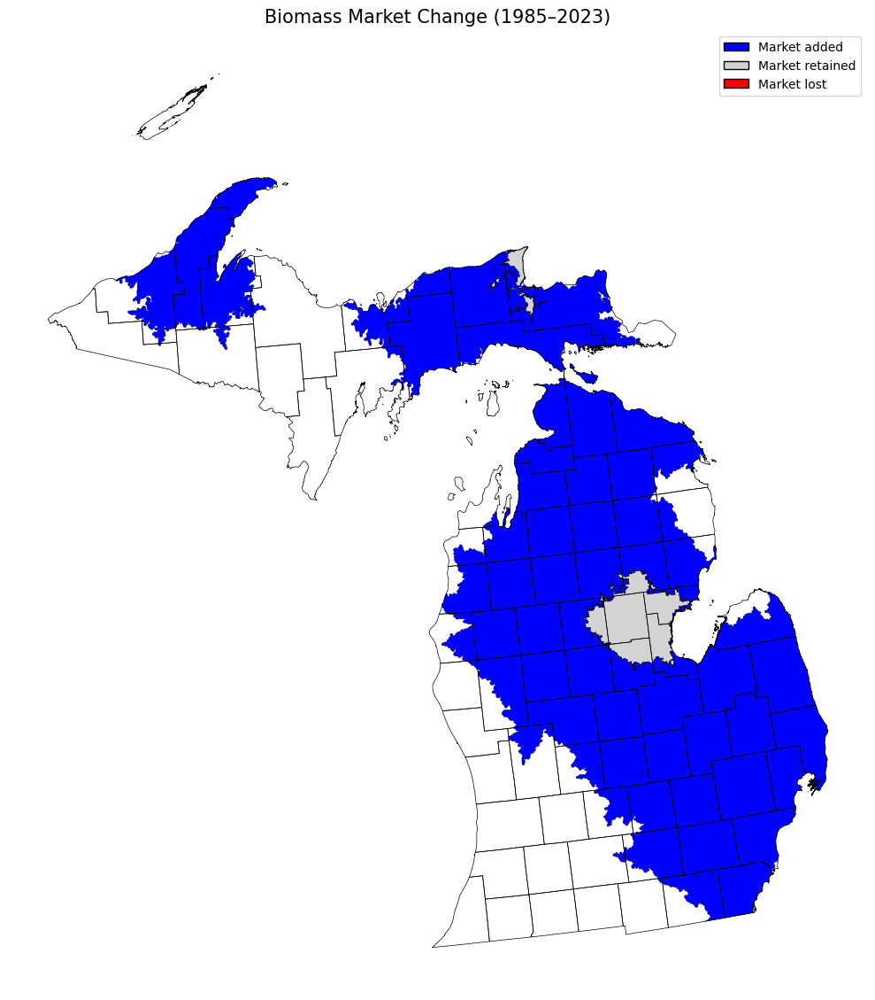

In [14]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Biomass_1985-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (1985–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#FOR 2001

In [15]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Biomass_1985-2023_change.shp")  # Updated shapefile for 1985–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (1985–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (1985–2023) has a forest area of 369,744.87 acres.
Polygon 'Market added' (1985–2023) has a forest area of 10,110,210.76 acres.
Polygon 'Market lost' (1985–2023) has a forest area of 27.80 acres.


#Using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1985-2023.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 4031456.30 acres.
   White/Red/Jack Pine Group: 892110.83 acres
   Spruce/Fir Group: 643476.86 acres
   Oak/Hickory Group: 1034.75 acres
   Elm/Ash/Cottonwood Group: 231.66 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 2494509.53 acres

Polygon 'Market Loss' has a forest area of 15.44 acres.
   Aspen/Birch Group: 15.44 acres

Polygon 'Market Add' has a forest area of 11087833.01 acres.
   White/Red/Jack Pine Group: 1366475.21 acres
   Spruce/Fir Group: 1702383.57 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 29930.59 acres
   Elm/Ash/Cottonwood Group: 40617.88 acres
   Maple/Beech/Birch Group: 2582463.47 acres
   Aspen/Birch Group: 5365823.30 acres



# 1994-2023

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


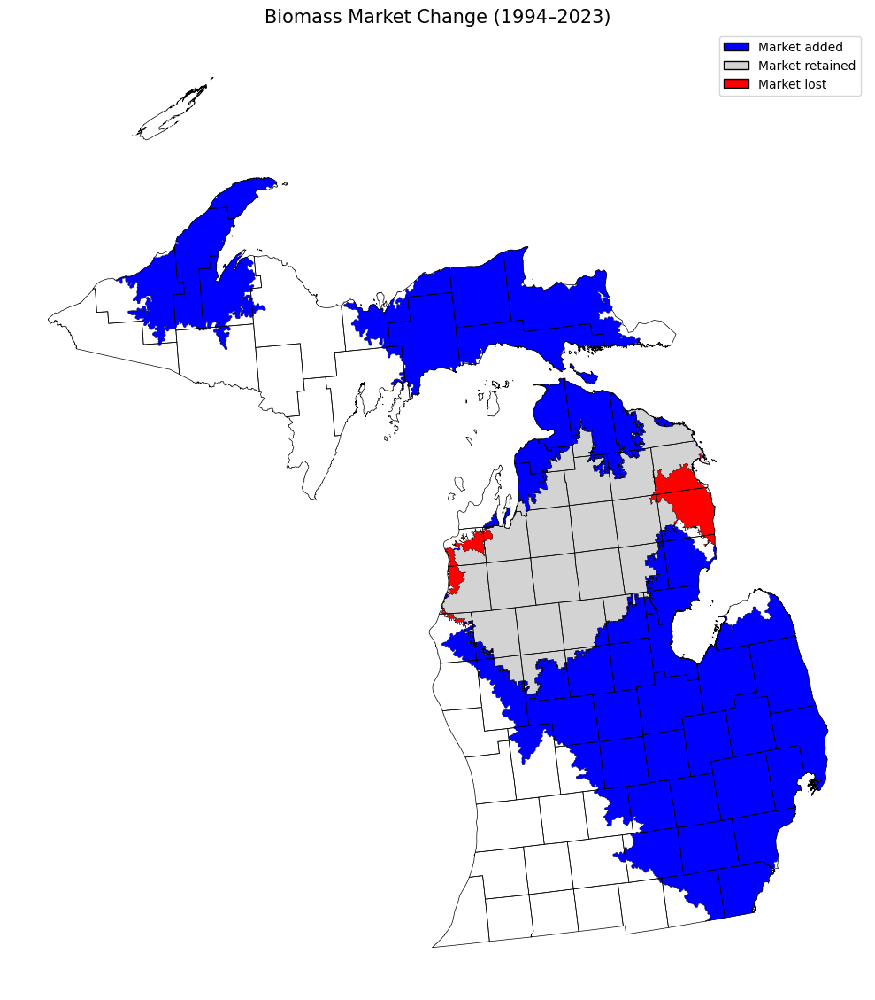

In [16]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Biomass_1994-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (1994–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#Using 2001

In [18]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Biomass_1994-2023_change.shp")  # Updated shapefile for 1994–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (1994–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (1994–2023) has a forest area of 3,734,905.02 acres.
Polygon 'Market added' (1994–2023) has a forest area of 6,745,050.61 acres.
Polygon 'Market lost' (1994–2023) has a forest area of 320,651.50 acres.


#using 2019

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1994-2023.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 7984101.55 acres.
   White/Red/Jack Pine Group: 1664839.05 acres
   Spruce/Fir Group: 746504.21 acres
   Oak/Hickory Group: 1050.20 acres
   Elm/Ash/Cottonwood Group: 1559.85 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 5570055.58 acres

Polygon 'Market Loss' has a forest area of 42301.29 acres.
   White/Red/Jack Pine Group: 5266.43 acres
   Spruce/Fir Group: 3567.58 acres
   Aspen/Birch Group: 33467.28 acres

Polygon 'Market Add' has a forest area of 7135187.76 acres.
   White/Red/Jack Pine Group: 593746.98 acres
   Spruce/Fir Group: 1599356.22 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 29915.15 acres
   Elm/Ash/Cottonwood Group: 39289.69 acres
   Maple/Beech/Birch Group: 2582463.47 acres
   Aspen/Birch Group: 2290277.25 acres



# 2002-2023

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


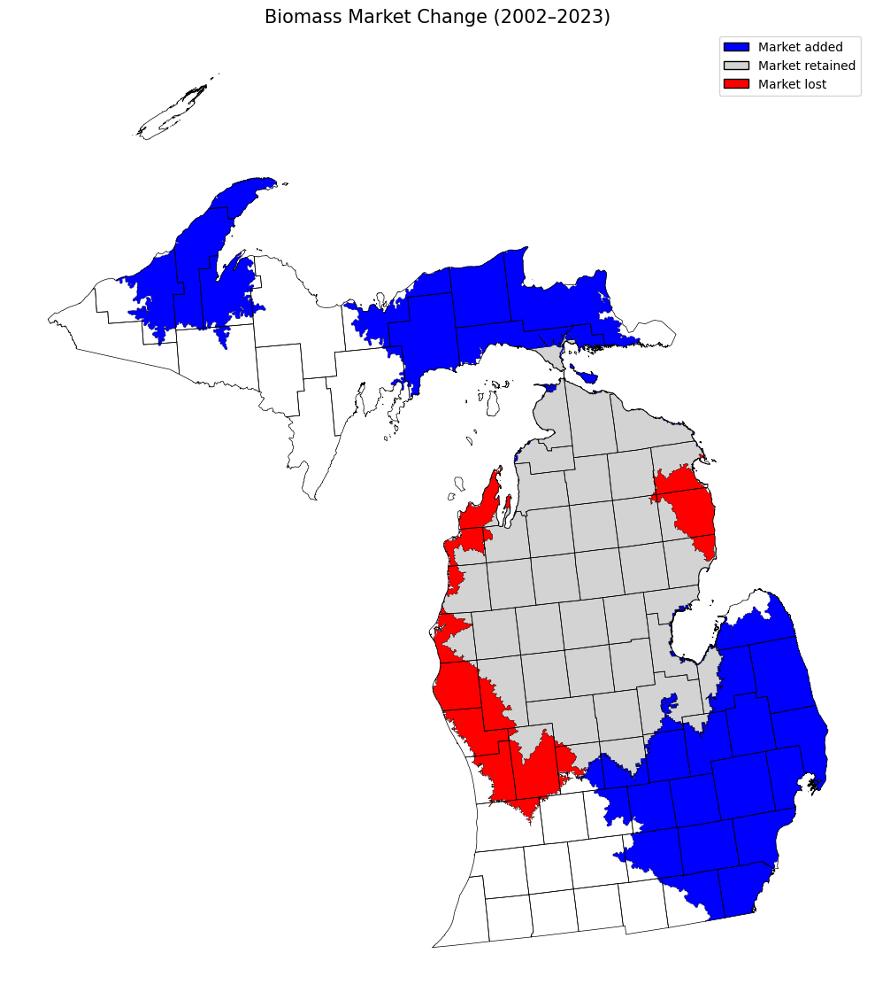

In [19]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Biomass_2002-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (2002–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001

In [21]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Biomass_2002-2023_change.shp")  # Updated shapefile for 2002–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (2002–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (2002–2023) has a forest area of 5,733,505.23 acres.
Polygon 'Market added' (2002–2023) has a forest area of 4,746,450.39 acres.
Polygon 'Market lost' (2002–2023) has a forest area of 1,130,503.08 acres.


#using 2019

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2002-2023.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 7559158.17 acres.
   White/Red/Jack Pine Group: 1631943.20 acres
   Spruce/Fir Group: 663754.92 acres
   Oak/Hickory Group: 942.09 acres
   Elm/Ash/Cottonwood Group: 1559.85 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 5260865.45 acres

Polygon 'Market Loss' has a forest area of 20092.73 acres.
   White/Red/Jack Pine Group: 1096.53 acres
   Spruce/Fir Group: 2455.61 acres
   Aspen/Birch Group: 16540.59 acres

Polygon 'Market Add' has a forest area of 7560131.14 acres.
   White/Red/Jack Pine Group: 626642.84 acres
   Spruce/Fir Group: 1682105.51 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 30023.26 acres
   Elm/Ash/Cottonwood Group: 39289.69 acres
   Maple/Beech/Birch Group: 2582463.47 acres
   Aspen/Birch Group: 2599467.38 acres



# Pulpwood

# 1985-1994

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


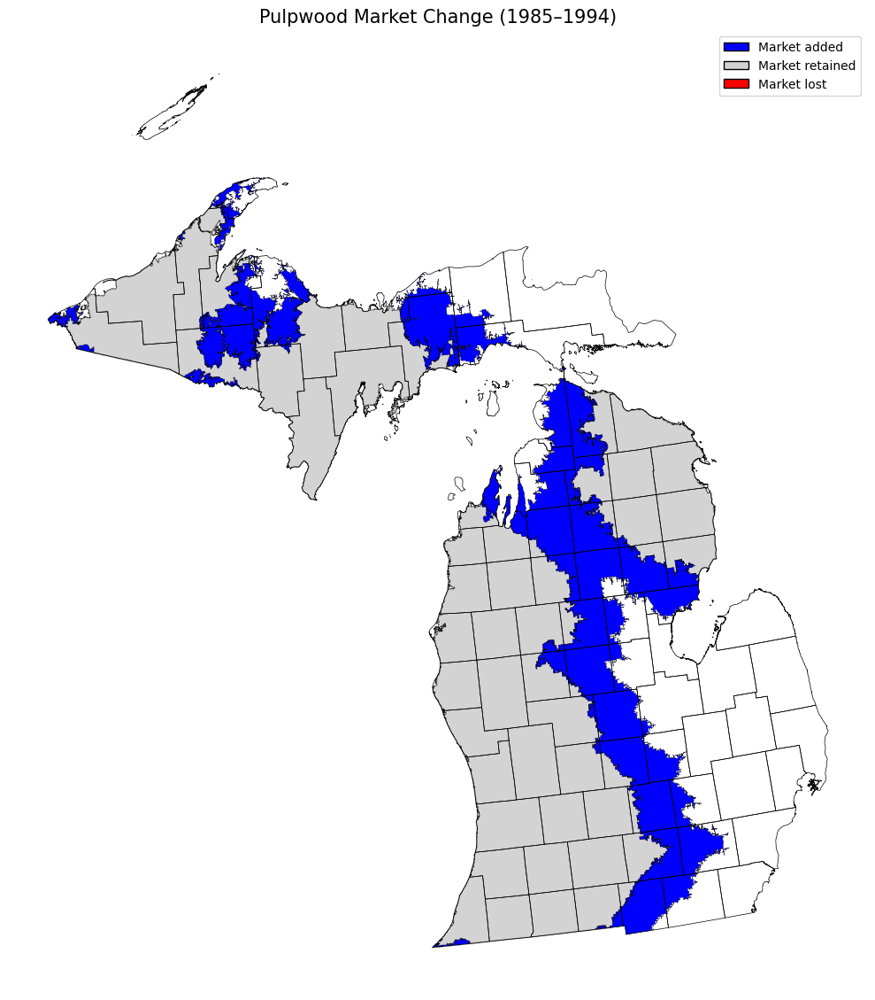

In [22]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Pulpwood_1985-1994_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (1985–1994)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [23]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Pulpwood_1985-1994_change.shp")  # Updated shapefile for pulpwood 1985–1994

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Pulpwood 1985–1994) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Pulpwood 1985–1994) has a forest area of 8,725,244.34 acres.
Polygon 'Market added' (Pulpwood 1985–1994) has a forest area of 3,570,278.38 acres.
Polygon 'Market lost' (Pulpwood 1985–1994) has a forest area of 1,331.03 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_1985-1994.shp")  # <-- updated for pulpwood 1985–1994

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 9213140.04 acres.
   White/Red/Jack Pine Group: 1090906.80 acres
   Spruce/Fir Group: 1388143.23 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 122008.09 acres
   Elm/Ash/Cottonwood Group: 161529.45 acres
   Maple/Beech/Birch Group: 2532208.49 acres
   Aspen/Birch Group: 3918174.10 acres

Polygon 'Market Loss' has a forest area of 6337084.95 acres.
   White/Red/Jack Pine Group: 937068.49 acres
   Spruce/Fir Group: 1012234.74 acres
   Oak/Hickory Group: 25251.04 acres
   Elm/Ash/Cottonwood Group: 17390.01 acres
   Maple/Beech/Birch Group: 1311401.68 acres
   Aspen/Birch Group: 3033738.97 acres

Polygon 'Market Add' has a forest area of 247.11 acres.
   White/Red/Jack Pine Group: 46.33 acres
   Spruce/Fir Group: 46.33 acres
   Oak/Hickory Group: 15.44 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 46.33 acres



# 1994-2002

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


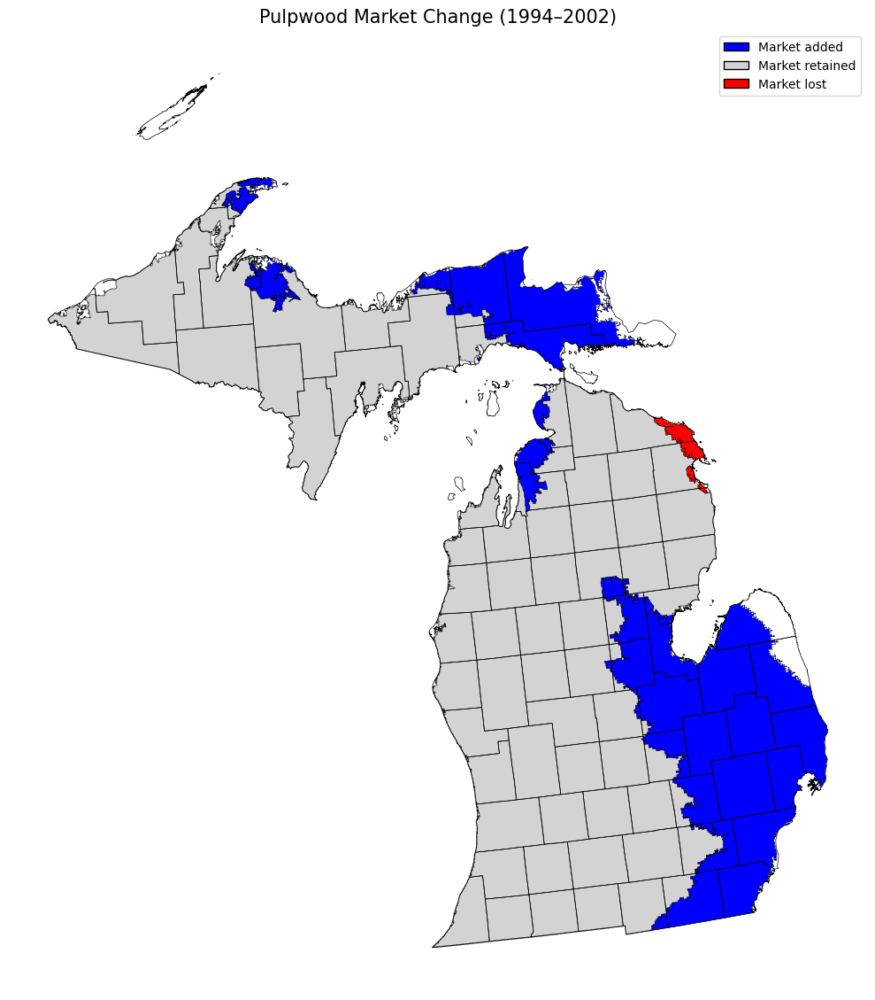

In [24]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Pulpwood_1994-2002_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (1994–2002)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [25]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Pulpwood_1994-2002_change.shp")  # Updated shapefile for pulpwood 1994–2002

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Pulpwood 1994–2002) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Pulpwood 1994–2002) has a forest area of 12,244,680.67 acres.
Polygon 'Market added' (Pulpwood 1994–2002) has a forest area of 2,860,132.27 acres.
Polygon 'Market lost' (Pulpwood 1994–2002) has a forest area of 50,842.05 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_1994-2002.shp")  # <-- updated for pulpwood 1994–2002

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 7669876.65 acres.
   White/Red/Jack Pine Group: 848141.58 acres
   Spruce/Fir Group: 1132930.09 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 122008.09 acres
   Elm/Ash/Cottonwood Group: 161529.45 acres
   Maple/Beech/Birch Group: 2532162.16 acres
   Aspen/Birch Group: 2872935.39 acres

Polygon 'Market Loss' has a forest area of 1543510.49 acres.
   White/Red/Jack Pine Group: 242811.55 acres
   Spruce/Fir Group: 255259.47 acres
   Oak/Hickory Group: 15.44 acres
   Maple/Beech/Birch Group: 139.00 acres
   Aspen/Birch Group: 1045285.04 acres

Polygon 'Market Add' has a forest area of 5479028.28 acres.
   White/Red/Jack Pine Group: 638225.88 acres
   Spruce/Fir Group: 892805.81 acres
   Oak/Hickory Group: 31552.22 acres
   Elm/Ash/Cottonwood Group: 17343.68 acres
   Maple/Beech/Birch Group: 1394073.75 acres
   Aspen/Birch Group: 2505026.94 acres



# 2002-2018

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


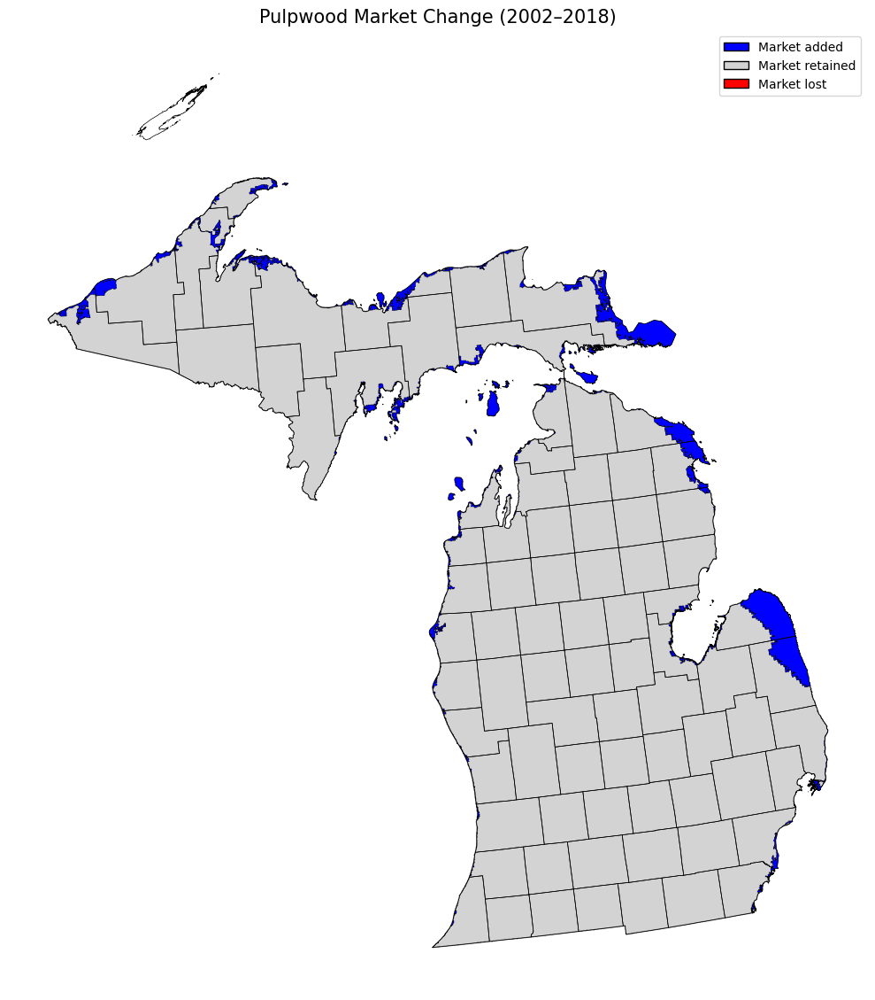

In [26]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Pulpwood_2002-2018_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (2002–2018)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [27]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Pulpwood_2002-2018_change.shp")  # Updated shapefile for pulpwood 2002–2018

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Pulpwood 2002–2018) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Pulpwood 2002–2018) has a forest area of 15,104,200.68 acres.
Polygon 'Market added' (Pulpwood 2002–2018) has a forest area of 613,339.79 acres.
Polygon 'Market lost' (Pulpwood 2002–2018) has a forest area of 612.25 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_2002-2018.shp")  # <-- updated for pulpwood 2002–2018

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 11998322.27 acres.
   White/Red/Jack Pine Group: 1479479.41 acres
   Spruce/Fir Group: 2005257.08 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 49668.11 acres
   Elm/Ash/Cottonwood Group: 99289.88 acres
   Maple/Beech/Birch Group: 3576721.32 acres
   Aspen/Birch Group: 4787736.60 acres

Polygon 'Market Loss' has a forest area of 1150582.66 acres.
   White/Red/Jack Pine Group: 6888.05 acres
   Spruce/Fir Group: 20478.83 acres
   Oak/Hickory Group: 103892.21 acres
   Elm/Ash/Cottonwood Group: 79583.25 acres
   Maple/Beech/Birch Group: 349514.58 acres
   Aspen/Birch Group: 590225.74 acres

Polygon 'Market Add' has a forest area of 2399837.43 acres.
   White/Red/Jack Pine Group: 452480.14 acres
   Spruce/Fir Group: 494472.55 acres
   Oak/Hickory Group: 401.55 acres
   Elm/Ash/Cottonwood Group: 679.54 acres
   Maple/Beech/Birch Group: 78996.38 acres
   Aspen/Birch Group: 1372807.27 acres



# 2018-2023

Unique ChangeType values: ['Market retained' 'Market lost']
Valid geometries: True    2
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    0


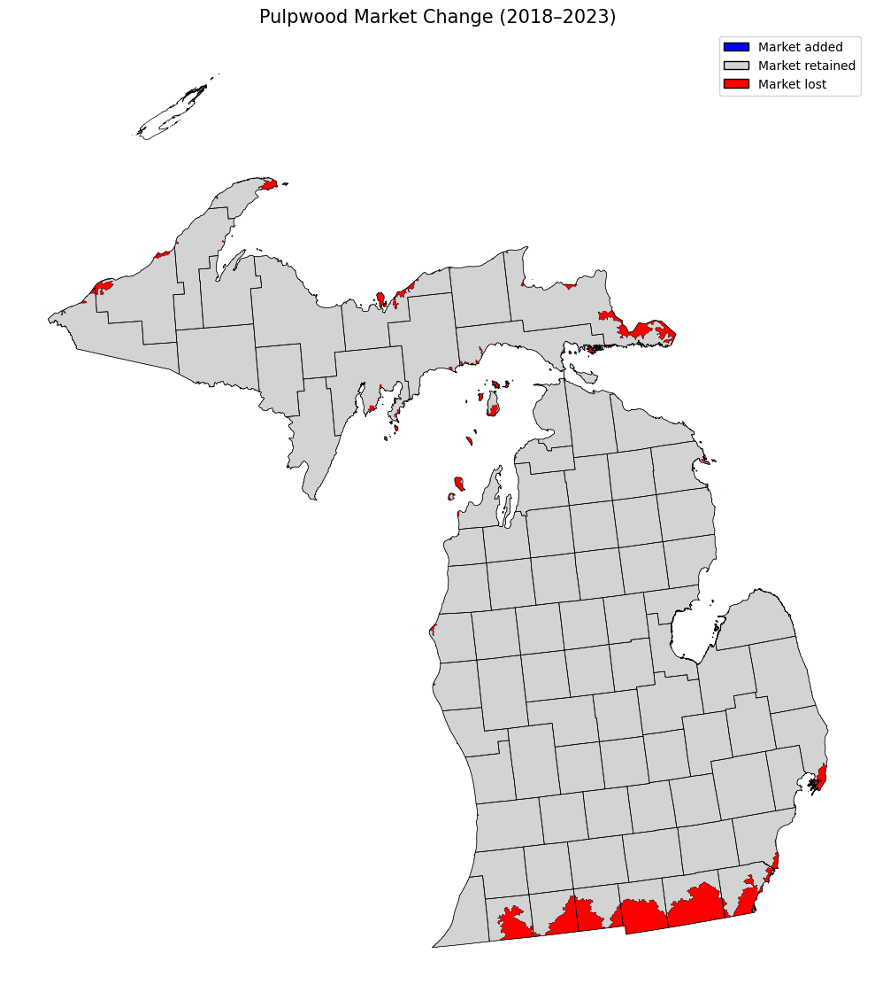

In [28]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Pulpwood_2018-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (2018–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [29]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Pulpwood_2018-2023_change.shp")  # Updated shapefile for pulpwood 2018–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Pulpwood 2018–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Pulpwood 2018–2023) has a forest area of 15,411,888.59 acres.
Polygon 'Market lost' (Pulpwood 2018–2023) has a forest area of 305,651.88 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_2018-2023.shp")  # <-- updated for pulpwood 2018–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 14172475.61 acres.
   White/Red/Jack Pine Group: 1929426.73 acres
   Spruce/Fir Group: 2498540.43 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 24973.05 acres
   Elm/Ash/Cottonwood Group: 68556.19 acres
   Maple/Beech/Birch Group: 3580211.68 acres
   Aspen/Birch Group: 6070628.54 acres

Polygon 'Market Loss' has a forest area of 225684.09 acres.
   White/Red/Jack Pine Group: 2532.83 acres
   Spruce/Fir Group: 1189.19 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 25096.60 acres
   Elm/Ash/Cottonwood Group: 31413.22 acres
   Maple/Beech/Birch Group: 75506.02 acres
   Aspen/Birch Group: 89915.33 acres

Polygon 'Market Add' has a forest area of 3149554.00 acres.
   White/Red/Jack Pine Group: 478055.51 acres
   Spruce/Fir Group: 654627.48 acres
   Oak/Hickory Group: 308.88 acres
   Elm/Ash/Cottonwood Group: 277.99 acres
   Maple/Beech/Birch Group: 128340.16 acres
   Aspen/Birch Group: 1887943.98 acres



# 1985-2023

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


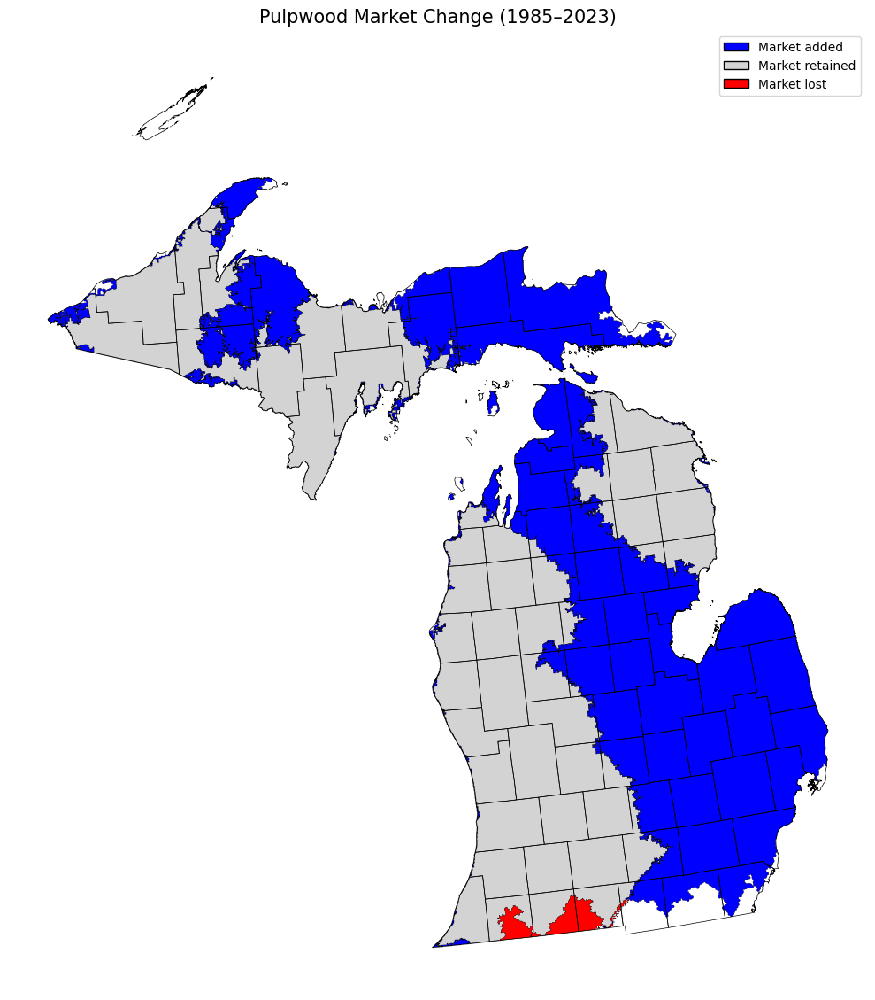

In [32]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (update for 1985-2023 data) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Pulpwood_1985-2023_change.shp")  # updated shapefile
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by ChangeType ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (1985–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [35]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Pulpwood_1985-2023_change.shp")  # Updated shapefile for pulpwood 1985–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Pulpwood 1985–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Pulpwood 1985–2023) has a forest area of 8,676,843.51 acres.
Polygon 'Market added' (Pulpwood 1985–2023) has a forest area of 6,735,045.08 acres.
Polygon 'Market lost' (Pulpwood 1985–2023) has a forest area of 49,731.86 acres.


# Using 2019 Map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_1985-2023.shp")  # <-- updated for pulpwood 1985–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 14641187.47 acres.
   White/Red/Jack Pine Group: 2021890.33 acres
   Spruce/Fir Group: 2384007.26 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 24046.41 acres
   Elm/Ash/Cottonwood Group: 68386.31 acres
   Maple/Beech/Birch Group: 3565647.93 acres
   Aspen/Birch Group: 6577070.23 acres

Polygon 'Market Loss' has a forest area of 909037.52 acres.
   White/Red/Jack Pine Group: 6084.96 acres
   Spruce/Fir Group: 16370.71 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 123212.73 acres
   Elm/Ash/Cottonwood Group: 110533.16 acres
   Maple/Beech/Birch Group: 277962.24 acres
   Aspen/Birch Group: 374842.84 acres

Polygon 'Market Add' has a forest area of 2681151.03 acres.
   White/Red/Jack Pine Group: 385591.91 acres
   Spruce/Fir Group: 769160.64 acres
   Oak/Hickory Group: 1235.53 acres
   Elm/Ash/Cottonwood Group: 447.88 acres
   Maple/Beech/Birch Group: 142903.91 acres
   Aspen/Birch Group: 1381811.16 acres



# 1994-2023

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


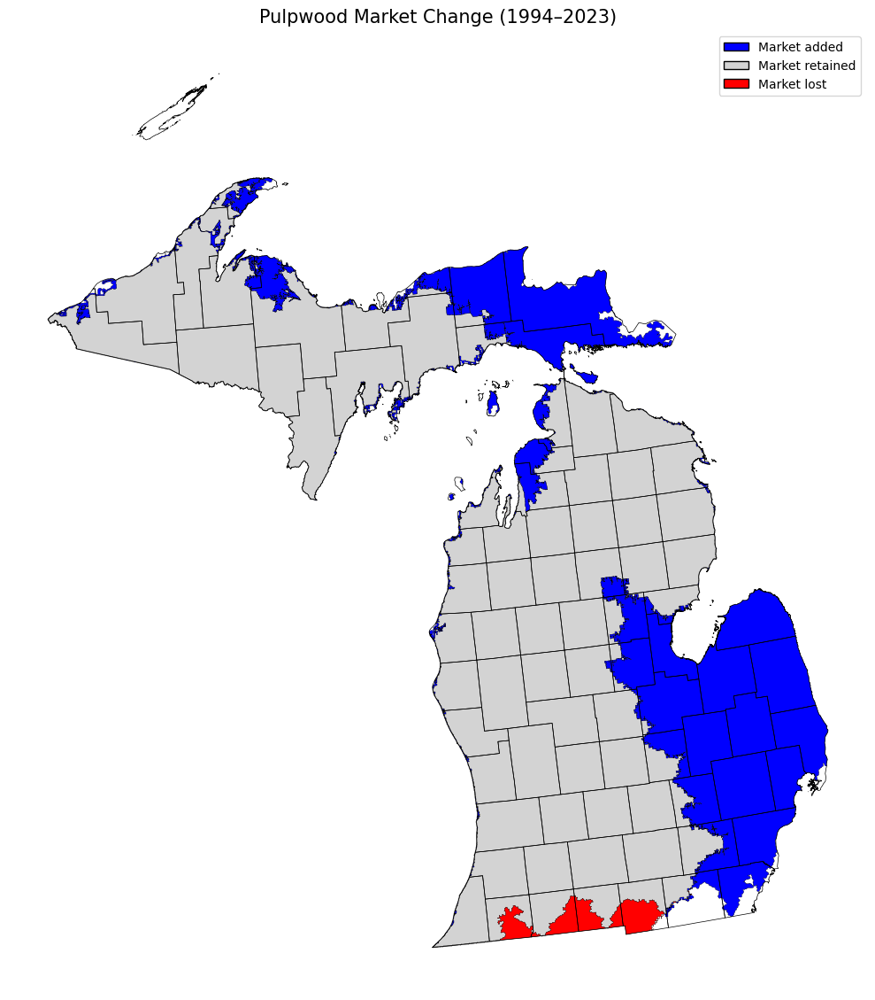

In [36]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Pulpwood_1994-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (1994–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [37]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Pulpwood_1994-2023_change.shp")  # Updated shapefile for pulpwood 1994–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Pulpwood 1994–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Pulpwood 1994–2023) has a forest area of 12,198,032.98 acres.
Polygon 'Market added' (Pulpwood 1994–2023) has a forest area of 3,213,855.61 acres.
Polygon 'Market lost' (Pulpwood 1994–2023) has a forest area of 97,489.74 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_1994-2023.shp")  # <-- updated for pulpwood 1994–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 8760088.47 acres.
   White/Red/Jack Pine Group: 1087864.32 acres
   Spruce/Fir Group: 1388174.11 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 19737.51 acres
   Elm/Ash/Cottonwood Group: 59428.75 acres
   Maple/Beech/Birch Group: 2483698.69 acres
   Aspen/Birch Group: 3721046.09 acres

Polygon 'Market Loss' has a forest area of 453298.68 acres.
   White/Red/Jack Pine Group: 3088.81 acres
   Spruce/Fir Group: 15.44 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 102286.03 acres
   Elm/Ash/Cottonwood Group: 102100.70 acres
   Maple/Beech/Birch Group: 48602.46 acres
   Aspen/Birch Group: 197174.35 acres

Polygon 'Market Add' has a forest area of 8561941.14 acres.
   White/Red/Jack Pine Group: 1319617.92 acres
   Spruce/Fir Group: 1764993.79 acres
   Oak/Hickory Group: 5544.42 acres
   Elm/Ash/Cottonwood Group: 9405.43 acres
   Maple/Beech/Birch Group: 1224853.15 acres
   Aspen/Birch Group: 4237526.42 acres



# 2002-2023

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


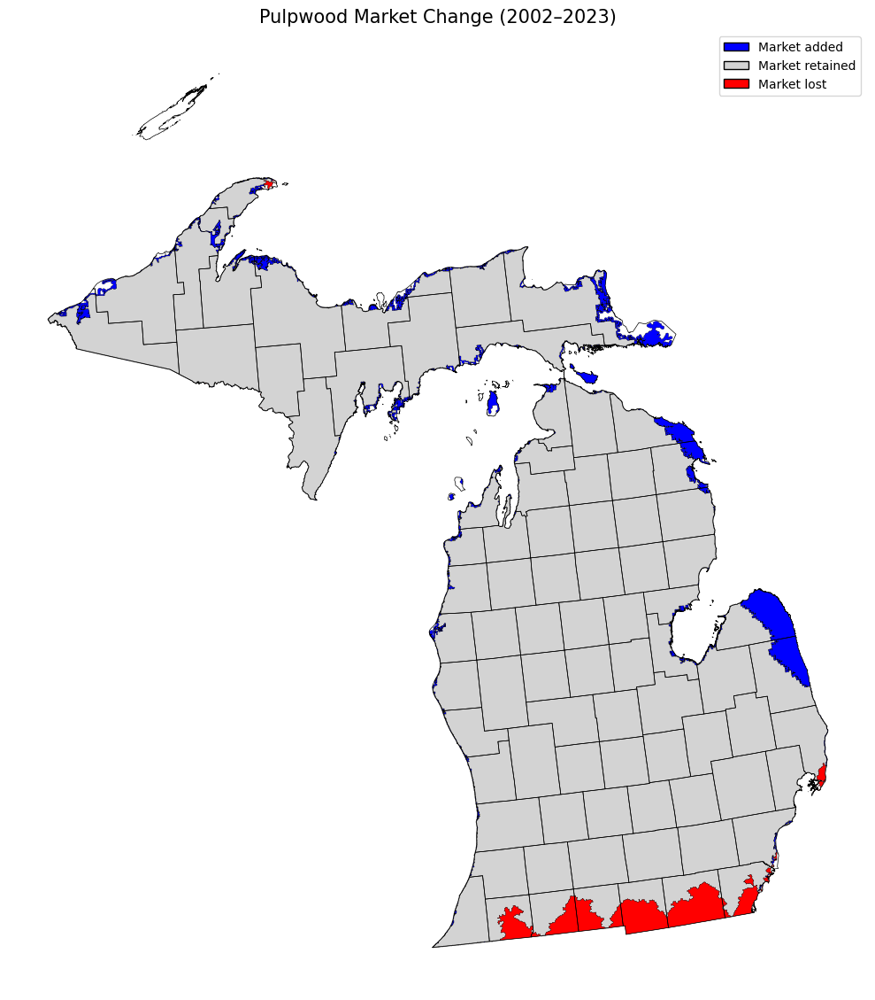

In [38]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Pulpwood_2002-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (2002–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [39]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Pulpwood_2002-2023_change.shp")  # Updated shapefile for pulpwood 2002–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Pulpwood 2002–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Pulpwood 2002–2023) has a forest area of 14,942,523.00 acres.
Polygon 'Market added' (Pulpwood 2002–2023) has a forest area of 469,365.59 acres.
Polygon 'Market lost' (Pulpwood 2002–2023) has a forest area of 162,289.94 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "pulpwood_change_2002-2023.shp")  # <-- updated for pulpwood 2002–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 12082137.20 acres.
   White/Red/Jack Pine Group: 1478259.33 acres
   Spruce/Fir Group: 2008114.23 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 24911.27 acres
   Elm/Ash/Cottonwood Group: 68108.32 acres
   Maple/Beech/Birch Group: 3632953.15 acres
   Aspen/Birch Group: 4869651.90 acres

Polygon 'Market Loss' has a forest area of 1066767.73 acres.
   White/Red/Jack Pine Group: 8108.13 acres
   Spruce/Fir Group: 17621.68 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 128649.04 acres
   Elm/Ash/Cottonwood Group: 110764.82 acres
   Maple/Beech/Birch Group: 293282.75 acres
   Aspen/Birch Group: 508310.43 acres

Polygon 'Market Add' has a forest area of 5240154.96 acres.
   White/Red/Jack Pine Group: 929222.91 acres
   Spruce/Fir Group: 1145053.68 acres
   Oak/Hickory Group: 370.66 acres
   Elm/Ash/Cottonwood Group: 725.87 acres
   Maple/Beech/Birch Group: 75598.69 acres
   Aspen/Birch Group: 3089183.16 acres



# Hardwood Sawlogs

# 1985-1994

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


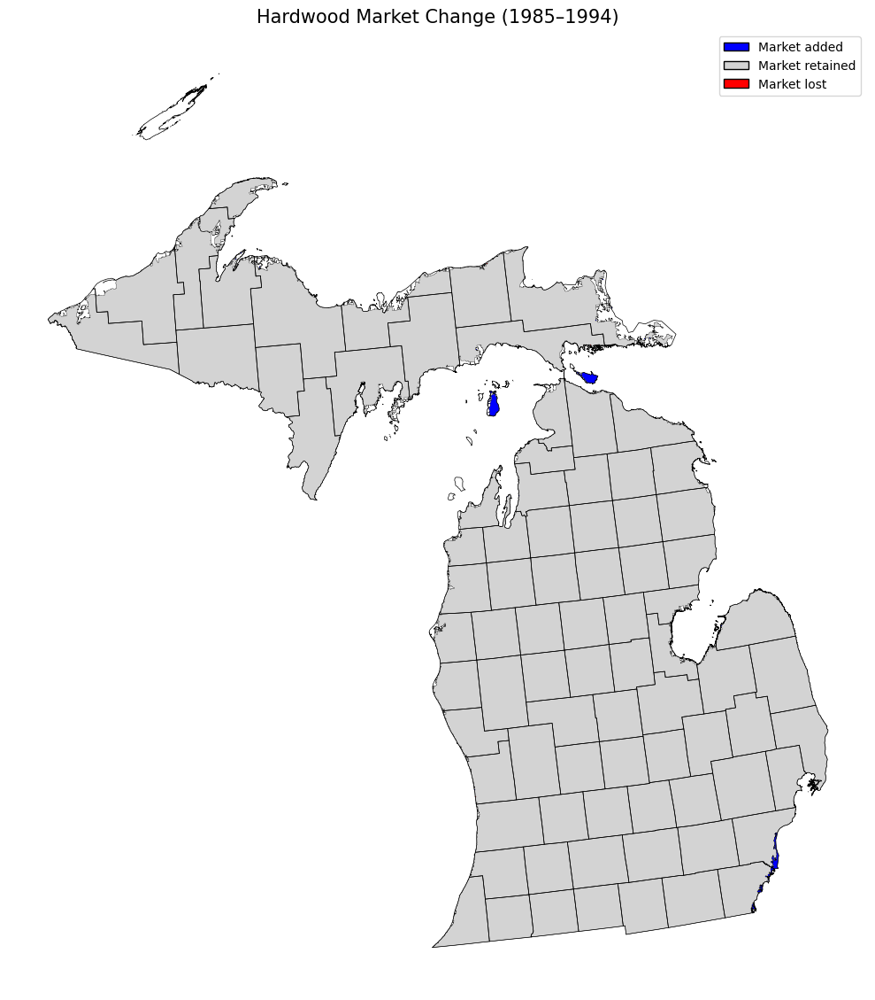

In [40]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Hardwood_1985-1994_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Hardwood Market Change (1985–1994)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [41]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Hardwood_1985-1994_change.shp")  # Updated shapefile for Hardwood 1985–1994

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Hardwood 1985–1994) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Hardwood 1985–1994) has a forest area of 15,220,093.35 acres.
Polygon 'Market added' (Hardwood 1985–1994) has a forest area of 31,128.78 acres.
Polygon 'Market lost' (Hardwood 1985–1994) has a forest area of 659.40 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_1985-1994.shp")  # <-- updated for hardwood 1985–1994

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18721215.34 acres.
   White/Red/Jack Pine Group: 2422323.98 acres
   Spruce/Fir Group: 3198959.55 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4012846.20 acres
   Aspen/Birch Group: 8753092.31 acres

Polygon 'Market Loss' has a forest area of 756.76 acres.
   White/Red/Jack Pine Group: 169.88 acres
   Spruce/Fir Group: 169.88 acres
   Maple/Beech/Birch Group: 247.11 acres
   Aspen/Birch Group: 169.88 acres

Polygon 'Market Add' has a forest area of 50687.41 acres.
   White/Red/Jack Pine Group: 4386.11 acres
   Spruce/Fir Group: 12231.70 acres
   Maple/Beech/Birch Group: 401.55 acres
   Aspen/Birch Group: 33668.06 acres



# 1994-2002

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


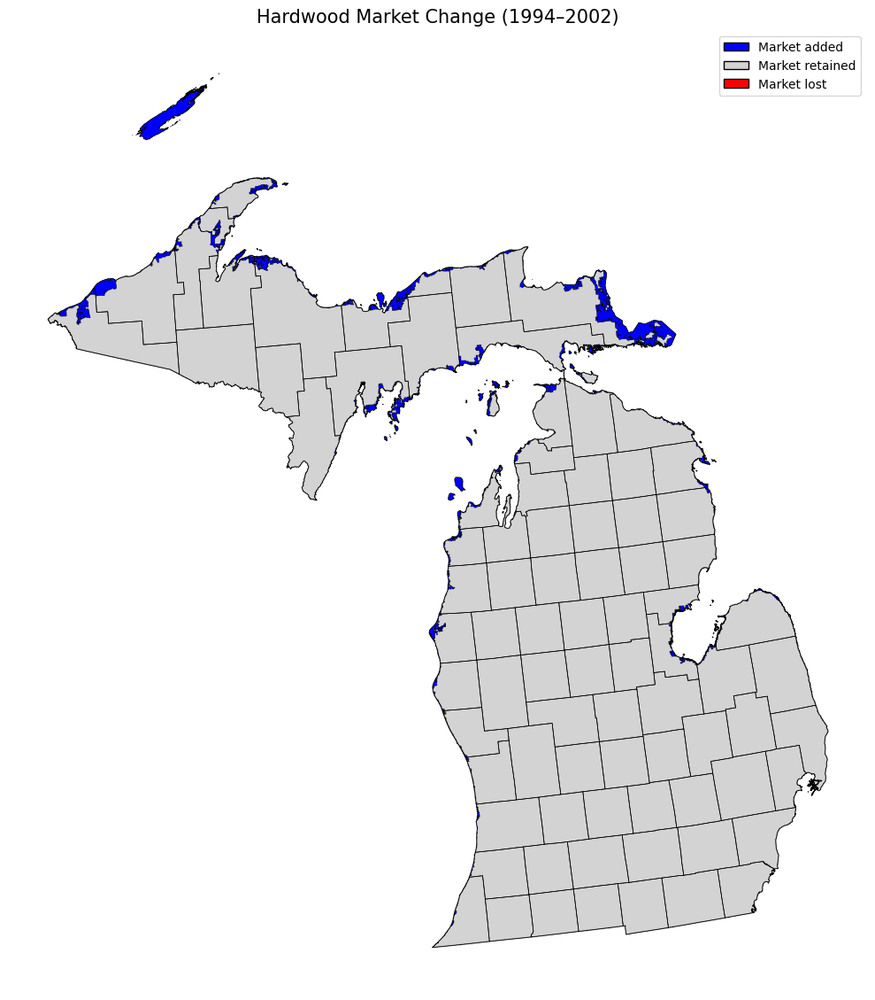

In [42]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Hardwood_1994-2002_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Hardwood Market Change (1994–2002)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [43]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Hardwood_1994-2002_change.shp")  # Updated shapefile for Hardwood 1994–2002

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Hardwood 1994–2002) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Hardwood 1994–2002) has a forest area of 15,250,576.07 acres.
Polygon 'Market added' (Hardwood 1994–2002) has a forest area of 565,601.48 acres.
Polygon 'Market lost' (Hardwood 1994–2002) has a forest area of 646.06 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_1994-2002.shp")  # <-- updated for hardwood 1994–2002

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18771084.22 acres.
   White/Red/Jack Pine Group: 2426571.10 acres
   Spruce/Fir Group: 3210959.59 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013185.97 acres
   Aspen/Birch Group: 8786374.26 acres

Polygon 'Market Loss' has a forest area of 818.54 acres.
   White/Red/Jack Pine Group: 139.00 acres
   Spruce/Fir Group: 231.66 acres
   Maple/Beech/Birch Group: 61.78 acres
   Aspen/Birch Group: 386.10 acres

Polygon 'Market Add' has a forest area of 617.76 acres.
   White/Red/Jack Pine Group: 46.33 acres
   Spruce/Fir Group: 231.66 acres
   Maple/Beech/Birch Group: 139.00 acres
   Aspen/Birch Group: 200.77 acres



# 2002-2018

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


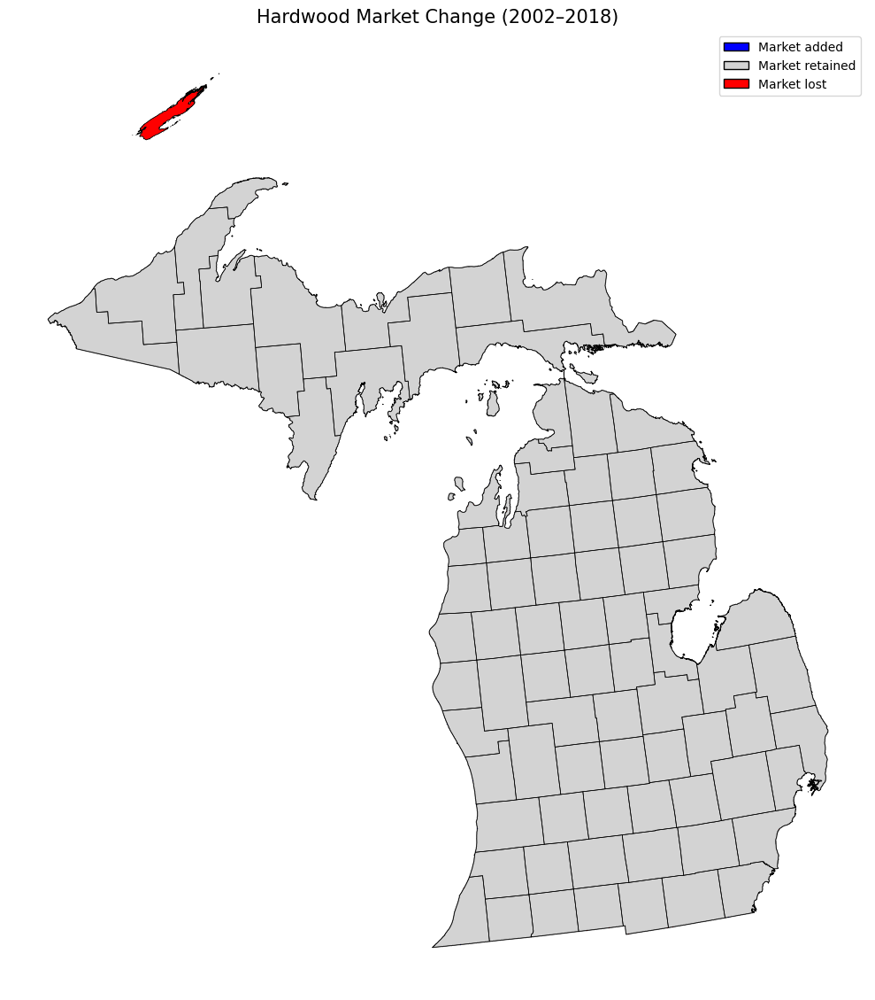

In [44]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Hardwood_2002-2018_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Hardwood Market Change (2002–2018)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [45]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Hardwood_2002-2018_change.shp")  # Updated shapefile for Hardwood 2002–2018

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Hardwood 2002–2018) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Hardwood 2002–2018) has a forest area of 15,715,724.40 acres.
Polygon 'Market added' (Hardwood 2002–2018) has a forest area of 1,816.07 acres.
Polygon 'Market lost' (Hardwood 2002–2018) has a forest area of 100,453.15 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_2002-2018.shp")  # <-- updated for hardwood 2002–2018

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18767315.87 acres.
   White/Red/Jack Pine Group: 2426015.11 acres
   Spruce/Fir Group: 3210975.03 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013170.53 acres
   Aspen/Birch Group: 8783161.90 acres

Polygon 'Market Loss' has a forest area of 4386.11 acres.
   White/Red/Jack Pine Group: 602.32 acres
   Spruce/Fir Group: 216.22 acres
   Maple/Beech/Birch Group: 154.44 acres
   Aspen/Birch Group: 3413.14 acres

Polygon 'Market Add' has a forest area of 756.76 acres.
   White/Red/Jack Pine Group: 216.22 acres
   Spruce/Fir Group: 200.77 acres
   Maple/Beech/Birch Group: 154.44 acres
   Aspen/Birch Group: 185.33 acres



# 2018-2023


Unique ChangeType values: ['Market retained' 'Market lost']
Valid geometries: True    2
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    0


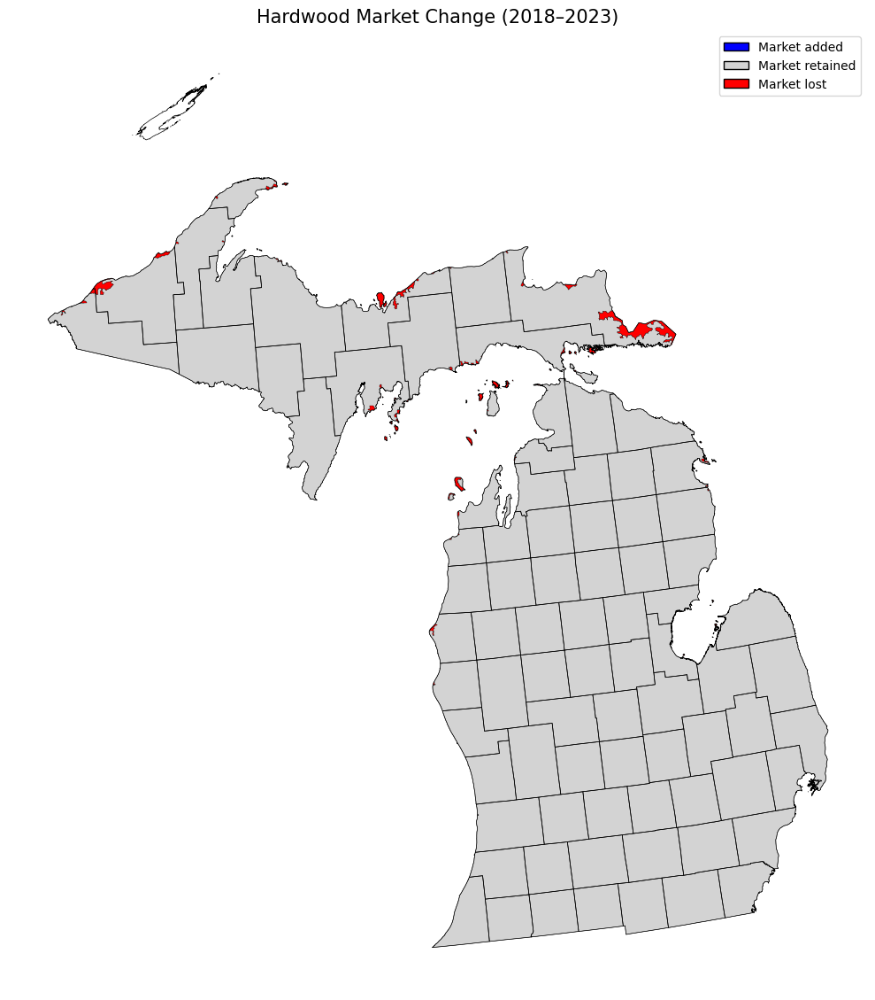

In [46]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Hardwood_2018-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Hardwood Market Change (2018–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [47]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Hardwood_2018-2023_change.shp")  # Updated shapefile for Hardwood 2018–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Hardwood 2018–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Hardwood 2018–2023) has a forest area of 15,597,652.05 acres.
Polygon 'Market lost' (Hardwood 2018–2023) has a forest area of 119,888.43 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_2018-2023.shp")  # <-- updated for hardwood 2018–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18767933.63 acres.
   White/Red/Jack Pine Group: 2426215.89 acres
   Spruce/Fir Group: 3211160.36 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013278.64 acres
   Aspen/Birch Group: 8783285.45 acres

Polygon 'Market Loss' has a forest area of 139.00 acres.
   White/Red/Jack Pine Group: 15.44 acres
   Spruce/Fir Group: 15.44 acres
   Maple/Beech/Birch Group: 46.33 acres
   Aspen/Birch Group: 61.78 acres

Polygon 'Market Add' has a forest area of 4123.56 acres.
   White/Red/Jack Pine Group: 617.76 acres
   Spruce/Fir Group: 386.10 acres
   Maple/Beech/Birch Group: 447.88 acres
   Aspen/Birch Group: 2671.82 acres



# 1985-2023

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


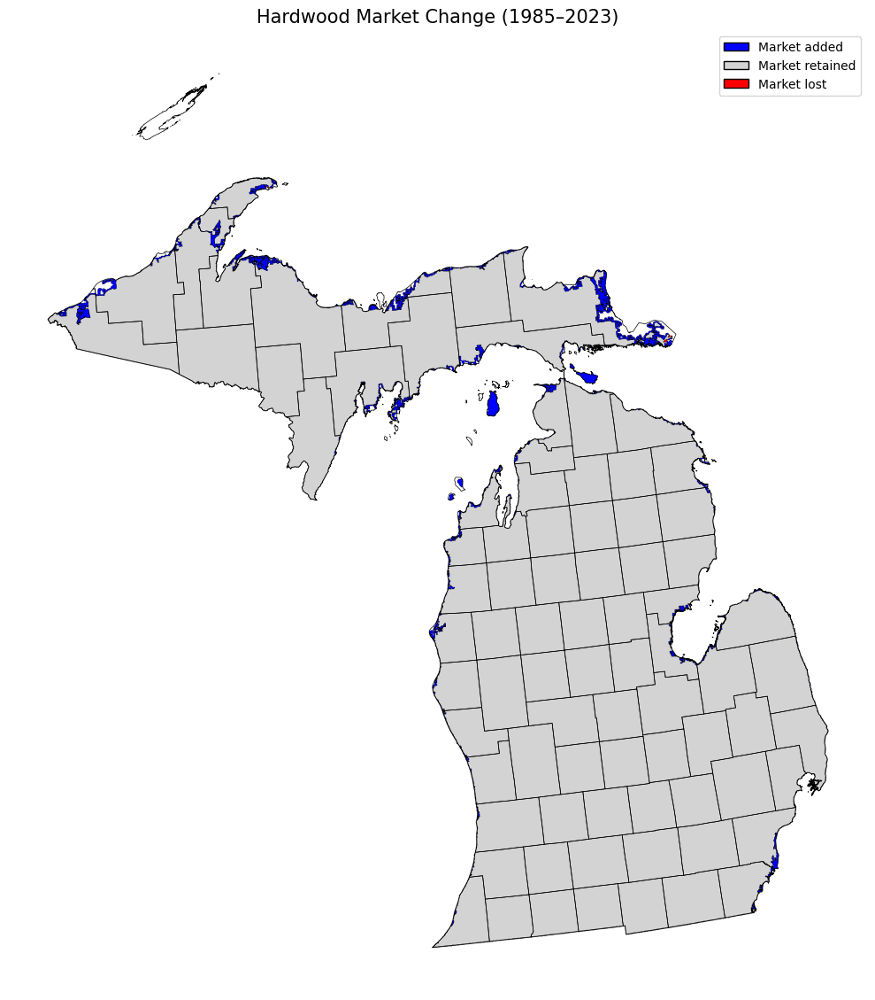

In [48]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Hardwood_1985-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Hardwood Market Change (1985–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


using 2001 map

In [49]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Hardwood_1985-2023_change.shp")  # Updated shapefile for Hardwood 1985–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Hardwood 1985–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Hardwood 1985–2023) has a forest area of 15,217,806.24 acres.
Polygon 'Market added' (Hardwood 1985–2023) has a forest area of 379,845.80 acres.
Polygon 'Market lost' (Hardwood 1985–2023) has a forest area of 2,946.50 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_1985-2023.shp")  # <-- updated for hardwood 1985–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18721817.66 acres.
   White/Red/Jack Pine Group: 2422493.87 acres
   Spruce/Fir Group: 3199129.44 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013016.09 acres
   Aspen/Birch Group: 8753184.97 acres

Polygon 'Market Loss' has a forest area of 154.44 acres.
   Maple/Beech/Birch Group: 77.22 acres
   Aspen/Birch Group: 77.22 acres

Polygon 'Market Add' has a forest area of 50239.54 acres.
   White/Red/Jack Pine Group: 4339.78 acres
   Spruce/Fir Group: 12417.03 acres
   Maple/Beech/Birch Group: 710.43 acres
   Aspen/Birch Group: 32772.30 acres



# 1994-2023

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


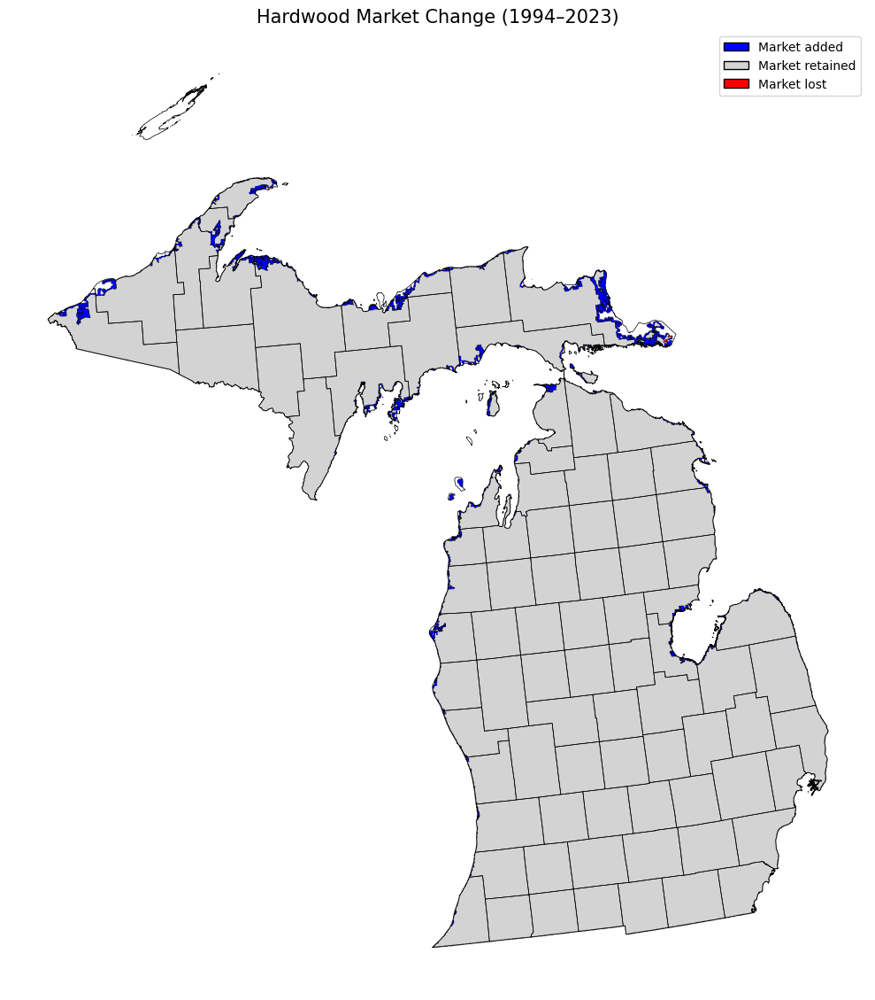

In [50]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Hardwood_1994-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Hardwood Market Change (1994–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [51]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Hardwood_1994-2023_change.shp")  # Updated shapefile for Hardwood 1994–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Hardwood 1994–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Hardwood 1994–2023) has a forest area of 15,248,225.14 acres.
Polygon 'Market added' (Hardwood 1994–2023) has a forest area of 349,426.91 acres.
Polygon 'Market lost' (Hardwood 1994–2023) has a forest area of 2,996.99 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_1994-2023.shp")  # <-- updated for hardwood 1994–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18770543.68 acres.
   White/Red/Jack Pine Group: 2426601.99 acres
   Spruce/Fir Group: 3211129.48 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013247.75 acres
   Aspen/Birch Group: 8785571.17 acres

Polygon 'Market Loss' has a forest area of 1359.08 acres.
   White/Red/Jack Pine Group: 108.11 acres
   Spruce/Fir Group: 61.78 acres
   Aspen/Birch Group: 1189.19 acres

Polygon 'Market Add' has a forest area of 1513.52 acres.
   White/Red/Jack Pine Group: 231.66 acres
   Spruce/Fir Group: 416.99 acres
   Maple/Beech/Birch Group: 478.77 acres
   Aspen/Birch Group: 386.10 acres



# 2002-2023

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


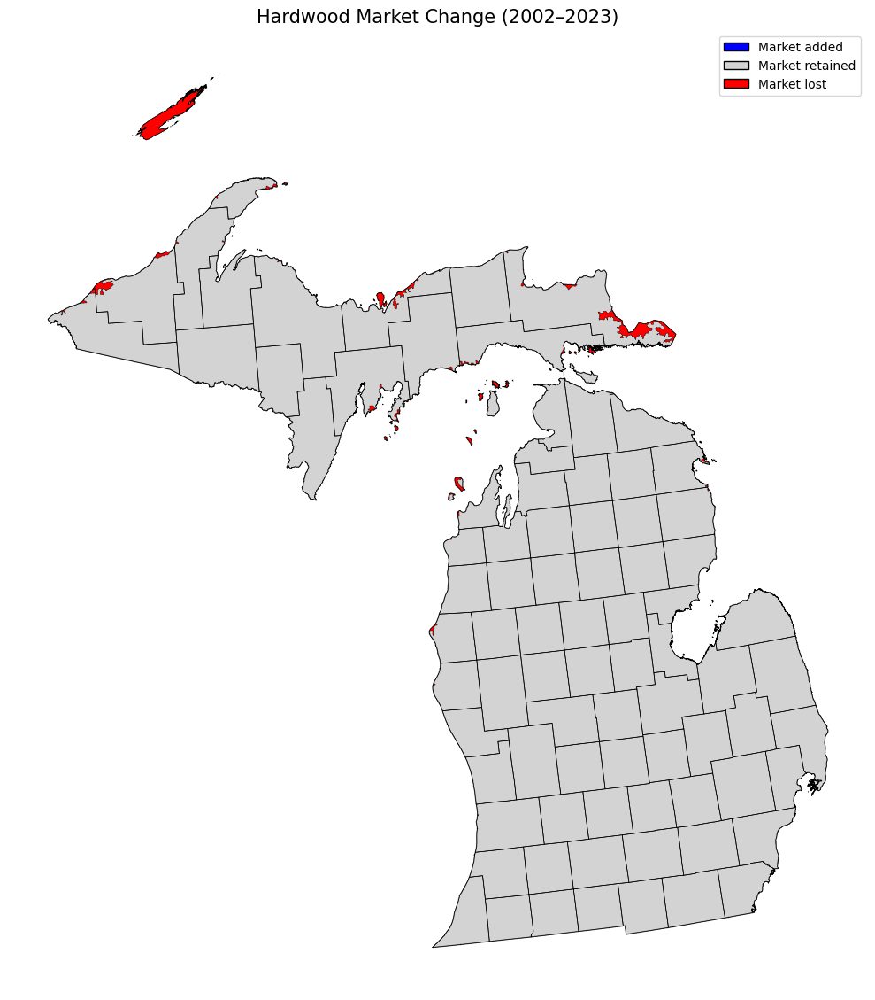

In [52]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Hardwood_2002-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Hardwood Market Change (2002–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [53]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Hardwood_2002-2023_change.shp")  # Updated shapefile for Hardwood 2002–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Hardwood 2002–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Hardwood 2002–2023) has a forest area of 15,596,150.22 acres.
Polygon 'Market added' (Hardwood 2002–2023) has a forest area of 1,501.83 acres.
Polygon 'Market lost' (Hardwood 2002–2023) has a forest area of 220,027.33 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "hardwood_change_2002-2023.shp")  # <-- updated for hardwood 2002–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18770528.23 acres.
   White/Red/Jack Pine Group: 2426524.77 acres
   Spruce/Fir Group: 3211098.59 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013263.19 acres
   Aspen/Birch Group: 8785648.39 acres

Polygon 'Market Loss' has a forest area of 1173.75 acres.
   White/Red/Jack Pine Group: 92.66 acres
   Spruce/Fir Group: 92.66 acres
   Maple/Beech/Birch Group: 61.78 acres
   Aspen/Birch Group: 926.64 acres

Polygon 'Market Add' has a forest area of 1528.96 acres.
   White/Red/Jack Pine Group: 308.88 acres
   Spruce/Fir Group: 447.88 acres
   Maple/Beech/Birch Group: 463.32 acres
   Aspen/Birch Group: 308.88 acres



# Softwood Sawlogs

# 1985-1994

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


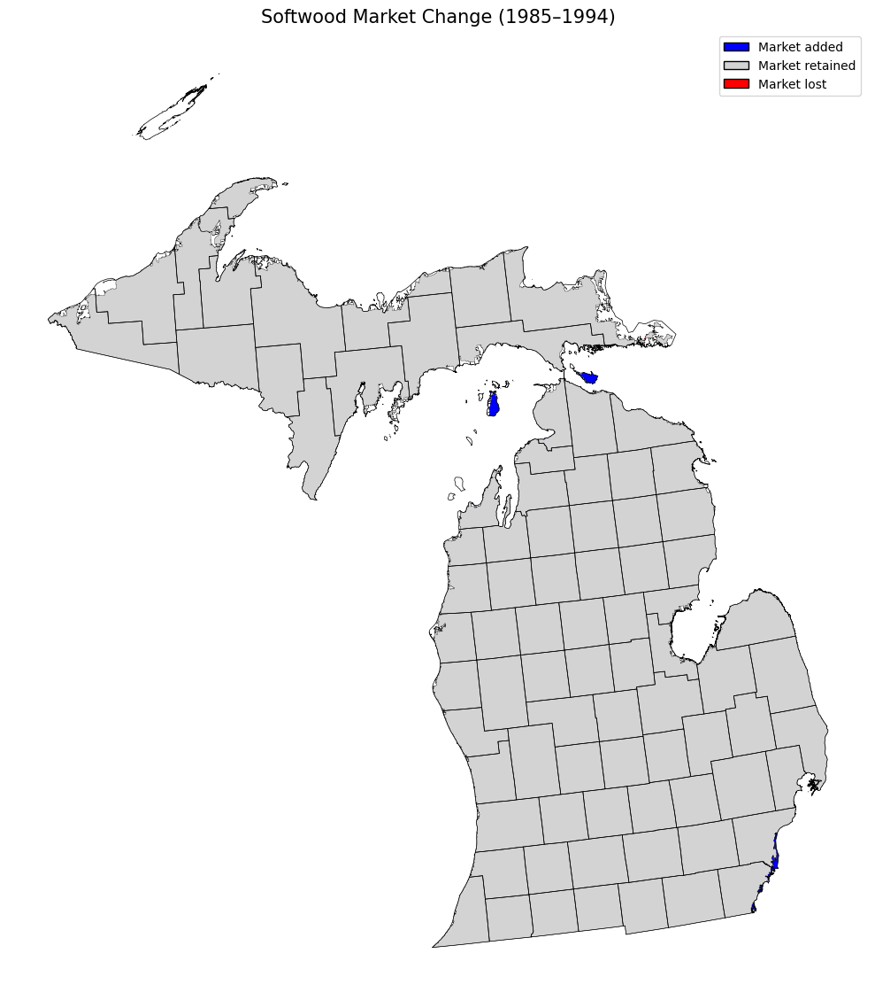

In [54]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Softwood_1985-1994_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Softwood Market Change (1985–1994)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [55]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Softwood_1985-1994_change.shp")  # Updated shapefile for Softwood 1985–1994

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Softwood 1985–1994) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Softwood 1985–1994) has a forest area of 15,220,147.39 acres.
Polygon 'Market added' (Softwood 1985–1994) has a forest area of 30,758.94 acres.
Polygon 'Market lost' (Softwood 1985–1994) has a forest area of 801.06 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "softwood_change_1985-1994.shp")  # <-- updated for softwood 1985–1994

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18168055.36 acres.
   White/Red/Jack Pine Group: 2348563.14 acres
   Spruce/Fir Group: 3024812.31 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154054.52 acres
   Elm/Ash/Cottonwood Group: 179089.35 acres
   Maple/Beech/Birch Group: 3815316.64 acres
   Aspen/Birch Group: 8646049.51 acres

Polygon 'Market Loss' has a forest area of 401.55 acres.
   White/Red/Jack Pine Group: 92.66 acres
   Spruce/Fir Group: 61.78 acres
   Oak/Hickory Group: 15.44 acres
   Maple/Beech/Birch Group: 46.33 acres
   Aspen/Birch Group: 185.33 acres

Polygon 'Market Add' has a forest area of 586287.50 acres.
   White/Red/Jack Pine Group: 76340.00 acres
   Spruce/Fir Group: 183645.35 acres
   Oak/Hickory Group: 154.44 acres
   Elm/Ash/Cottonwood Group: 509.65 acres
   Maple/Beech/Birch Group: 198008.33 acres
   Aspen/Birch Group: 127629.73 acres



# 1994-2002

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


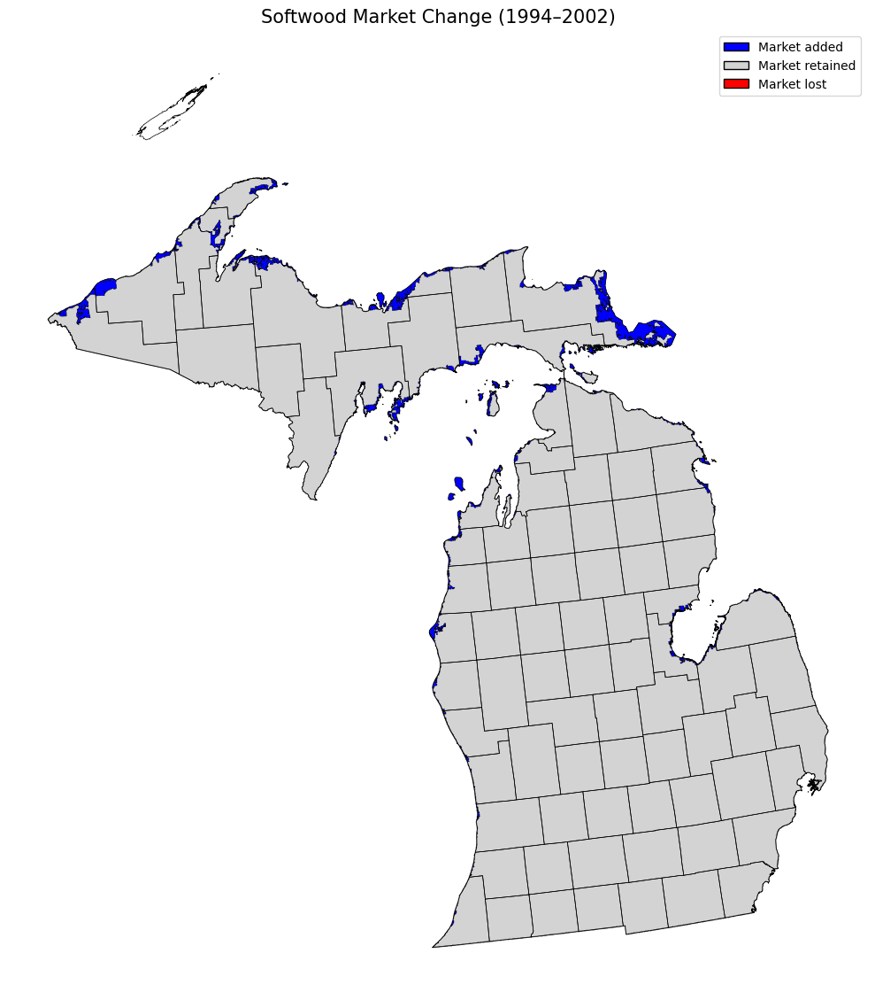

In [56]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Softwood_1994-2002_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Softwood Market Change (1994–2002)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [57]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Softwood_1994-2002_change.shp")  # Updated shapefile for Softwood 1994–2002

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Softwood 1994–2002) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Softwood 1994–2002) has a forest area of 15,250,147.30 acres.
Polygon 'Market added' (Softwood 1994–2002) has a forest area of 467,393.18 acres.
Polygon 'Market lost' (Softwood 1994–2002) has a forest area of 759.03 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "softwood_change_1994-2002.shp")  # <-- updated for softwood 1994–2002

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18753833.20 acres.
   White/Red/Jack Pine Group: 2424733.26 acres
   Spruce/Fir Group: 3208318.66 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154208.96 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013201.42 acres
   Aspen/Birch Group: 8773602.02 acres

Polygon 'Market Loss' has a forest area of 509.65 acres.
   White/Red/Jack Pine Group: 169.88 acres
   Spruce/Fir Group: 139.00 acres
   Maple/Beech/Birch Group: 123.55 acres
   Aspen/Birch Group: 77.22 acres

Polygon 'Market Add' has a forest area of 12556.02 acres.
   White/Red/Jack Pine Group: 1312.75 acres
   Spruce/Fir Group: 2841.71 acres
   Oak/Hickory Group: 15.44 acres
   Maple/Beech/Birch Group: 154.44 acres
   Aspen/Birch Group: 8231.69 acres



# 2002-2018

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


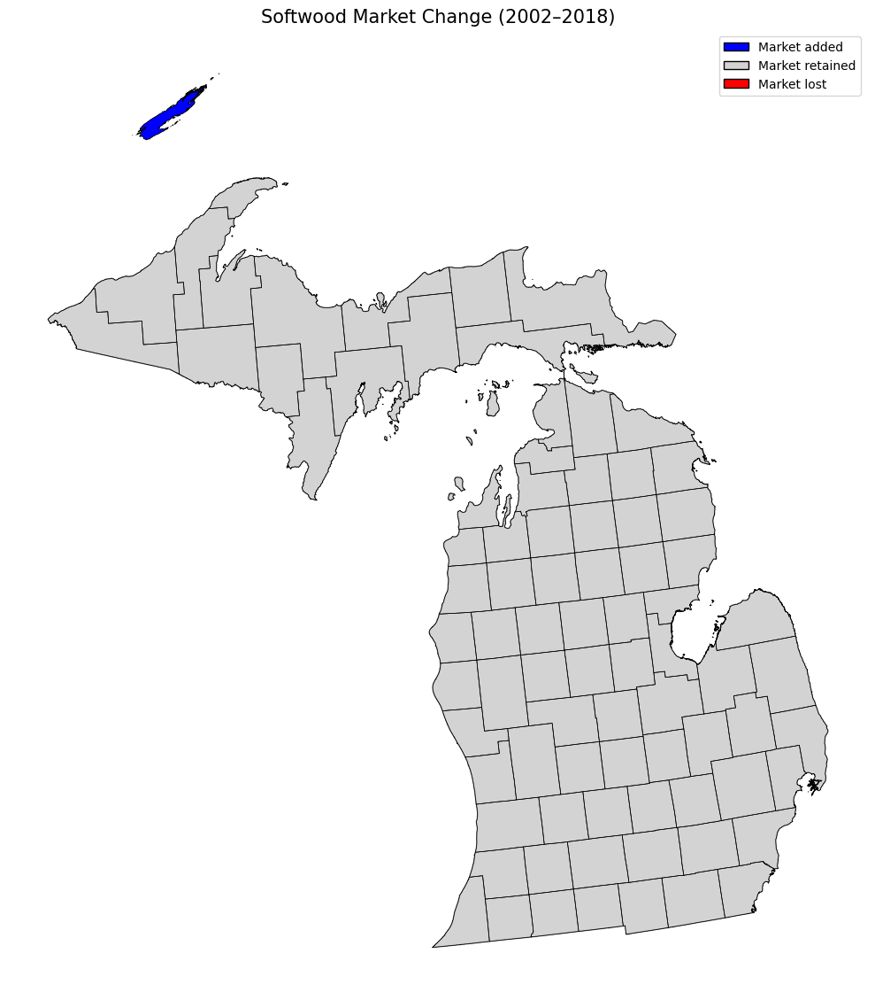

In [58]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Softwood_2002-2018_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Softwood Market Change (2002–2018)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [59]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Softwood_2002-2018_change.shp")  # Updated shapefile for Softwood 2002–2018

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Softwood 2002–2018) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Softwood 2002–2018) has a forest area of 15,715,722.18 acres.
Polygon 'Market added' (Softwood 2002–2018) has a forest area of 100,543.66 acres.
Polygon 'Market lost' (Softwood 2002–2018) has a forest area of 1,818.30 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "softwood_change_2002-2018.shp")  # <-- updated for softwood 2002–2018

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18186433.79 acres.
   White/Red/Jack Pine Group: 2306091.97 acres
   Spruce/Fir Group: 3060518.98 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 153838.31 acres
   Elm/Ash/Cottonwood Group: 177174.29 acres
   Maple/Beech/Birch Group: 3801123.55 acres
   Aspen/Birch Group: 8687516.82 acres

Polygon 'Market Loss' has a forest area of 579955.44 acres.
   White/Red/Jack Pine Group: 119954.03 acres
   Spruce/Fir Group: 150641.39 acres
   Oak/Hickory Group: 386.10 acres
   Elm/Ash/Cottonwood Group: 2424.72 acres
   Maple/Beech/Birch Group: 212232.31 acres
   Aspen/Birch Group: 94316.89 acres

Polygon 'Market Add' has a forest area of 586.87 acres.
   White/Red/Jack Pine Group: 108.11 acres
   Spruce/Fir Group: 108.11 acres
   Maple/Beech/Birch Group: 154.44 acres
   Aspen/Birch Group: 216.22 acres



# 2018-2023

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


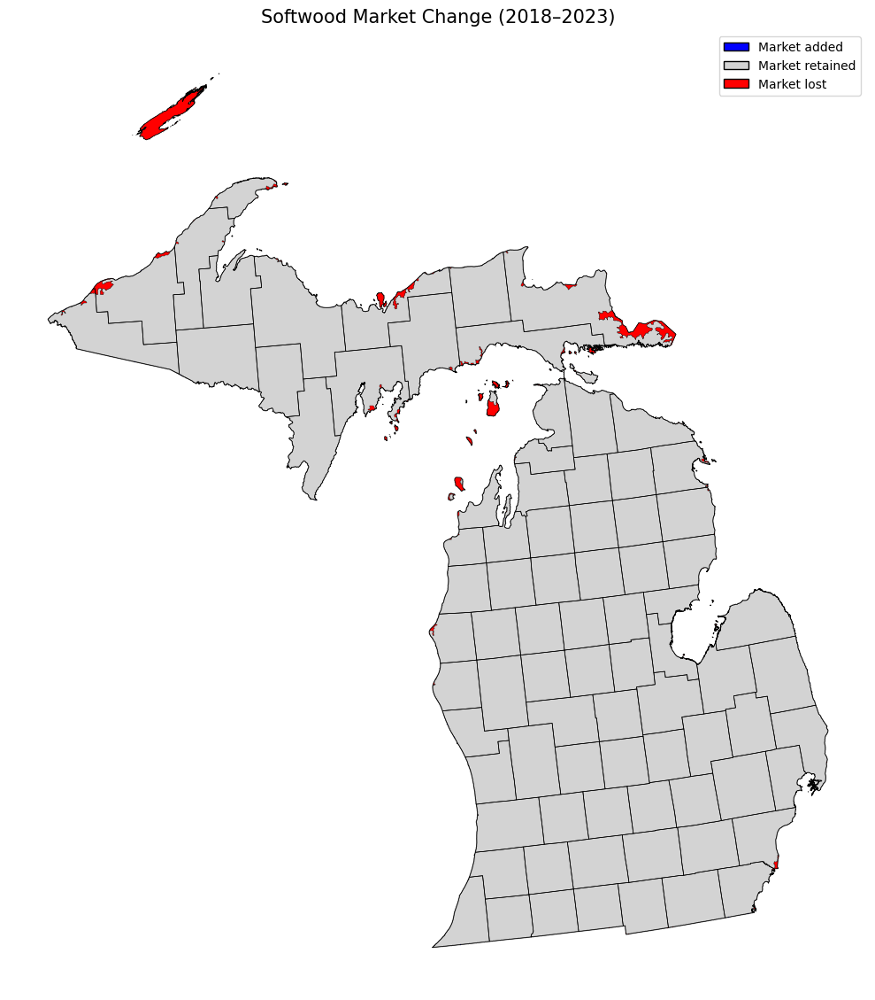

In [60]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Softwood_2018-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Softwood Market Change (2018–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [61]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Softwood_2018-2023_change.shp")  # Updated shapefile for Softwood 2018–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Softwood 2018–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Softwood 2018–2023) has a forest area of 15,573,876.29 acres.
Polygon 'Market added' (Softwood 2018–2023) has a forest area of 1,482.70 acres.
Polygon 'Market lost' (Softwood 2018–2023) has a forest area of 242,389.54 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "softwood_change_2018-2023.shp")  # <-- updated for softwood 2018–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18186789.00 acres.
   White/Red/Jack Pine Group: 2306200.08 acres
   Spruce/Fir Group: 3060611.64 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 153838.31 acres
   Elm/Ash/Cottonwood Group: 177174.29 acres
   Maple/Beech/Birch Group: 3801169.88 acres
   Aspen/Birch Group: 8687624.93 acres

Polygon 'Market Loss' has a forest area of 231.66 acres.
   Spruce/Fir Group: 15.44 acres
   Maple/Beech/Birch Group: 108.11 acres
   Aspen/Birch Group: 108.11 acres

Polygon 'Market Add' has a forest area of 577484.39 acres.
   White/Red/Jack Pine Group: 119892.26 acres
   Spruce/Fir Group: 150347.95 acres
   Oak/Hickory Group: 386.10 acres
   Elm/Ash/Cottonwood Group: 2424.72 acres
   Maple/Beech/Birch Group: 212417.64 acres
   Aspen/Birch Group: 92015.72 acres



# 1985-2023

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


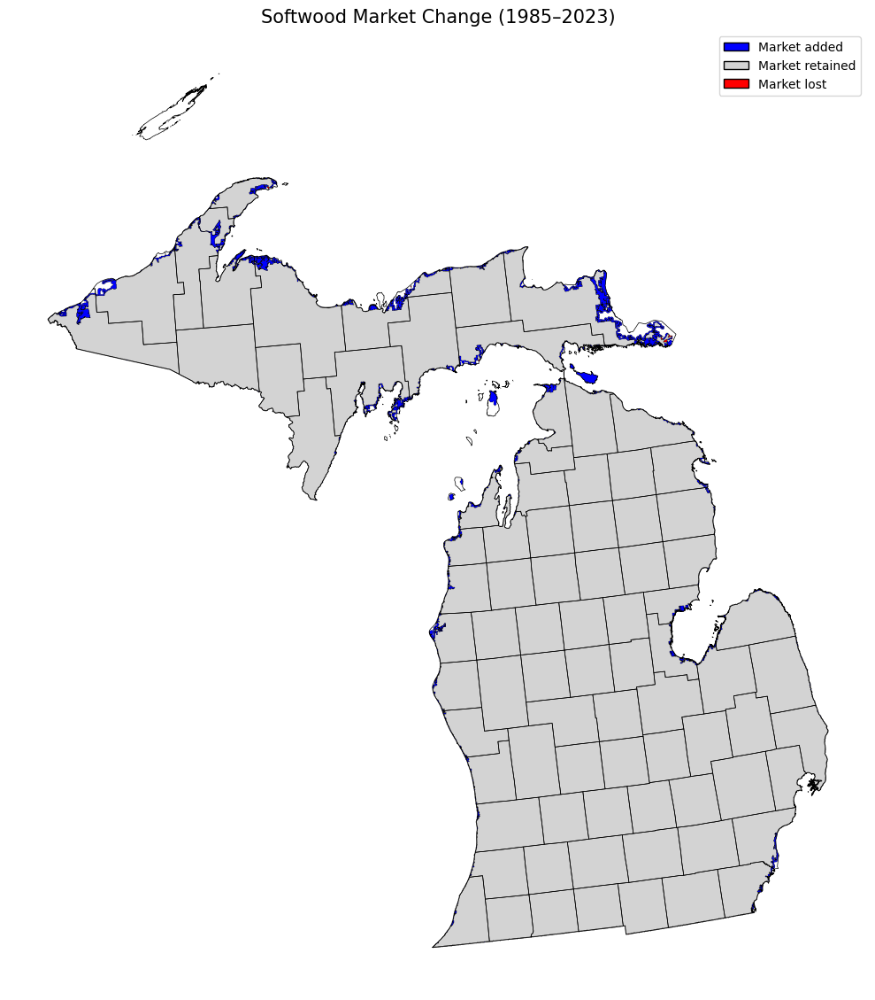

In [62]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Softwood_1985-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Softwood Market Change (1985–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [63]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Softwood_1985-2023_change.shp")  # Updated shapefile for Softwood 1985–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Softwood 1985–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Softwood 1985–2023) has a forest area of 15,217,551.16 acres.
Polygon 'Market added' (Softwood 1985–2023) has a forest area of 357,807.84 acres.
Polygon 'Market lost' (Softwood 1985–2023) has a forest area of 3,397.30 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "softwood_change_1985-2023.shp")  # <-- updated for softwood 1985–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18168410.57 acres.
   White/Red/Jack Pine Group: 2348655.80 acres
   Spruce/Fir Group: 3024874.08 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154069.97 acres
   Elm/Ash/Cottonwood Group: 179089.35 acres
   Maple/Beech/Birch Group: 3815316.64 acres
   Aspen/Birch Group: 8646234.84 acres

Polygon 'Market Loss' has a forest area of 46.33 acres.
   Maple/Beech/Birch Group: 46.33 acres

Polygon 'Market Add' has a forest area of 595862.82 acres.
   White/Red/Jack Pine Group: 77436.53 acres
   Spruce/Fir Group: 186085.51 acres
   Oak/Hickory Group: 154.44 acres
   Elm/Ash/Cottonwood Group: 509.65 acres
   Maple/Beech/Birch Group: 198270.87 acres
   Aspen/Birch Group: 133405.81 acres



# 1994-2023

Unique ChangeType values: ['Market retained' 'Market added' 'Market lost']
Valid geometries: True    3
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    1


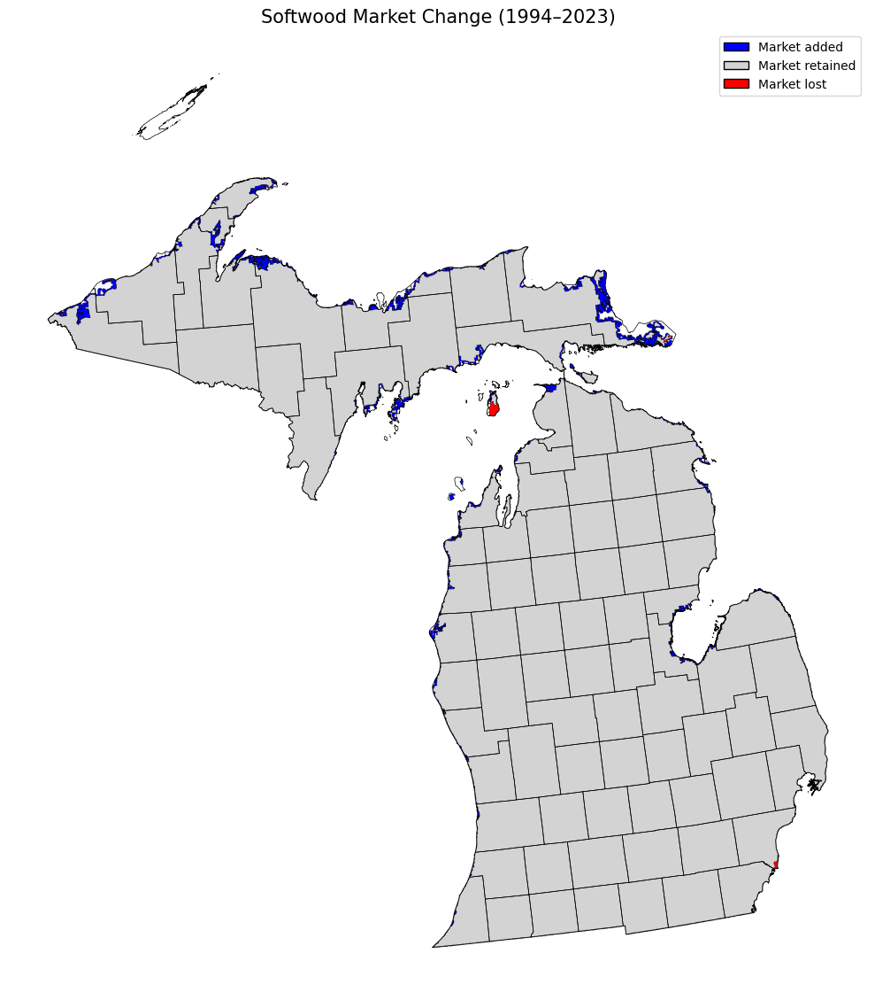

In [64]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Softwood_1994-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Softwood Market Change (1994–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [65]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Softwood_1994-2023_change.shp")  # Updated shapefile for Softwood 1994–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Softwood 1994–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Softwood 1994–2023) has a forest area of 15,238,162.46 acres.
Polygon 'Market added' (Softwood 1994–2023) has a forest area of 337,196.54 acres.
Polygon 'Market lost' (Softwood 1994–2023) has a forest area of 12,743.87 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "softwood_change_1994-2023.shp")  # <-- updated for softwood 1994–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18754172.97 acres.
   White/Red/Jack Pine Group: 2424856.81 acres
   Spruce/Fir Group: 3208426.76 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154208.96 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013278.64 acres
   Aspen/Birch Group: 8773632.91 acres

Polygon 'Market Loss' has a forest area of 169.88 acres.
   White/Red/Jack Pine Group: 46.33 acres
   Spruce/Fir Group: 30.89 acres
   Maple/Beech/Birch Group: 46.33 acres
   Aspen/Birch Group: 46.33 acres

Polygon 'Market Add' has a forest area of 10100.42 acres.
   White/Red/Jack Pine Group: 1235.53 acres
   Spruce/Fir Group: 2532.83 acres
   Oak/Hickory Group: 15.44 acres
   Maple/Beech/Birch Group: 308.88 acres
   Aspen/Birch Group: 6007.74 acres



# 2002-2023

Unique ChangeType values: ['Market retained' 'Market lost']
Valid geometries: True    2
Name: count, dtype: int64
Market retained rows: 1
Market lost rows:     1
Market added rows:    0


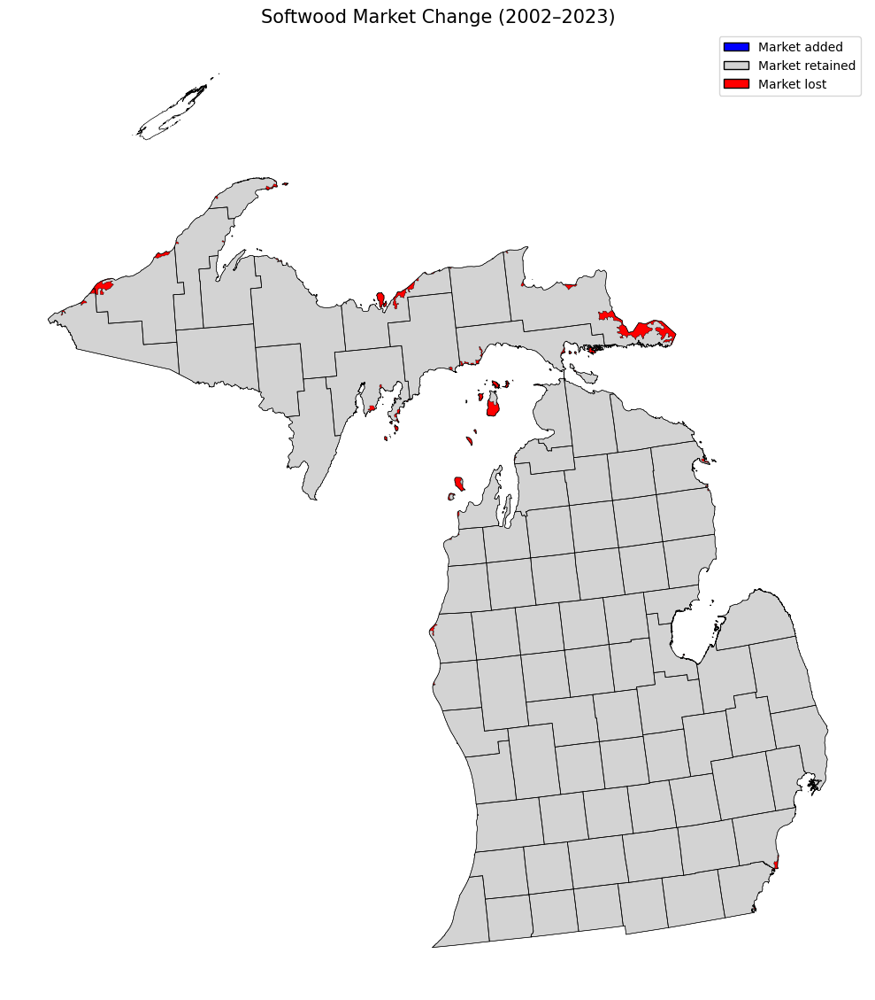

In [66]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (Colab base_path to the folder containing shapefiles) ---
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Cover Calculation/Data/Khanal Thesis Data/Data"

change_fp   = os.path.join(base_path, "Softwood_2002-2023_change.shp")
counties_fp = os.path.join(base_path, "Michigan Counties.shp")

# --- Load shapefiles ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Inspect ChangeType column ---
print("Unique ChangeType values:", gdf_change["ChangeType"].unique())

# --- Clean ChangeType column (remove extra spaces) ---
gdf_change["ChangeType"] = gdf_change["ChangeType"].str.strip()

# --- Ensure geometries are valid ---
print("Valid geometries:", gdf_change.is_valid.value_counts())
gdf_change = gdf_change[gdf_change.is_valid]  # drop invalid geometries if any

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by actual ChangeType values ---
retain = gdf_change[gdf_change["ChangeType"] == "Market retained"]
loss   = gdf_change[gdf_change["ChangeType"] == "Market lost"]
add    = gdf_change[gdf_change["ChangeType"] == "Market added"]

# --- Debug: row counts ---
print(f"Market retained rows: {len(retain)}")
print(f"Market lost rows:     {len(loss)}")
print(f"Market added rows:    {len(add)}")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Softwood Market Change (2002–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


#using 2001 map

In [67]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# --- Paths (Colab base_path) ---
raster_path    = os.path.join(base_path, "lulc2001.tif")  # Land cover raster
shapefile_path = os.path.join(base_path, "Softwood_2002-2023_change.shp")  # Updated shapefile for Softwood 2002–2023

# --- Forest land cover class codes ---
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# --- Open raster ---
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # --- Open shapefile ---
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # --- Loop through features ---
        for feature in shp:
            # Use ChangeType column instead of 'status'
            polygon_label = feature["properties"].get("ChangeType", "unknown").strip()
            geom = feature["geometry"]

            # Reproject geometry if CRS differs
            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' (Softwood 2002–2023) has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market retained' (Softwood 2002–2023) has a forest area of 15,575,359.00 acres.
Polygon 'Market lost' (Softwood 2002–2023) has a forest area of 142,181.47 acres.


#using 2019 map

In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "softwood_change_2002-2023.shp")  # <-- updated for softwood 2002–2023

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 18763145.97 acres.
   White/Red/Jack Pine Group: 2425829.79 acres
   Spruce/Fir Group: 3210712.49 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 154224.41 acres
   Elm/Ash/Cottonwood Group: 179599.00 acres
   Maple/Beech/Birch Group: 4013263.19 acres
   Aspen/Birch Group: 8779347.21 acres

Polygon 'Market Loss' has a forest area of 3243.25 acres.
   White/Red/Jack Pine Group: 216.22 acres
   Spruce/Fir Group: 447.88 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 2486.49 acres

Polygon 'Market Add' has a forest area of 1127.42 acres.
   White/Red/Jack Pine Group: 262.55 acres
   Spruce/Fir Group: 247.11 acres
   Maple/Beech/Birch Group: 324.33 acres
   Aspen/Birch Group: 293.44 acres



# 🌲 Forest Cover Area Estimation in Michigan (1980s–2020s)

## 📘 Introduction

This project aims to estimate forest cover area in the state of **Michigan** from the **1980s to the 2020s**, focusing on how forest dynamics vary across:

- **Competition levels** (ranging from 1 = lowest to 5 = highest)
- **Forest product types**, including:
  - Hardwood sawlogs
  - Softwood sawlogs
  - Pulpwood
  - Wood biomass

The goal is to analyze how forest cover associated with each product type has changed over time and across different levels of ecological competition. These estimates will help inform sustainable forest management, resource allocation, and long-term planning for timber and biomass industries.

The analysis will be structured by decade and will incorporate historical data, remote sensing insights, and forest inventory records to model trends and identify key patterns in forest utilization and growth.



# Biomass

# 1985

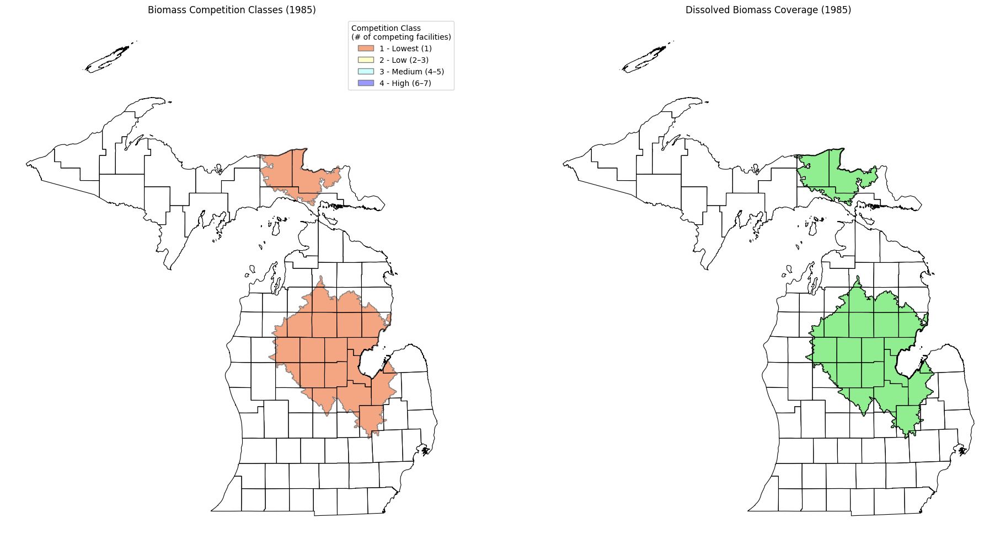

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_1985_fp   = os.path.join(base_path, "biomass_hotspots_1985.shp")   # UNDISSOLVED
dissolved_1985_fp = os.path.join(base_path, "biomass_coverage_1985.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_1985_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_1985_fp)  # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (update if 1985 has a different class scheme) ---
color_map = {
    "1 - Lowest (1985)": "#F4A582",
    "2 - Low (1985)":    "#FFFFCC",
    "3 - Medium (1985)": "#CCFFFF",
    "4 - High (1985)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (1985)")
axes[0].axis("off")

# Right: dissolved biomass area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (1985)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for biomass 1985 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_hotspots_1985.shp")

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (1985)' has a forest area of 3103480.11 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/biomass_hotspots_1985.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (1985)' has a forest area of 4031286.41 acres.
   White/Red/Jack Pine Group: 892049.05 acres
   Spruce/Fir Group: 643430.53 acres
   Oak/Hickory Group: 1034.75 acres
   Elm/Ash/Cottonwood Group: 231.66 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 2494447.75 acres



# 1994

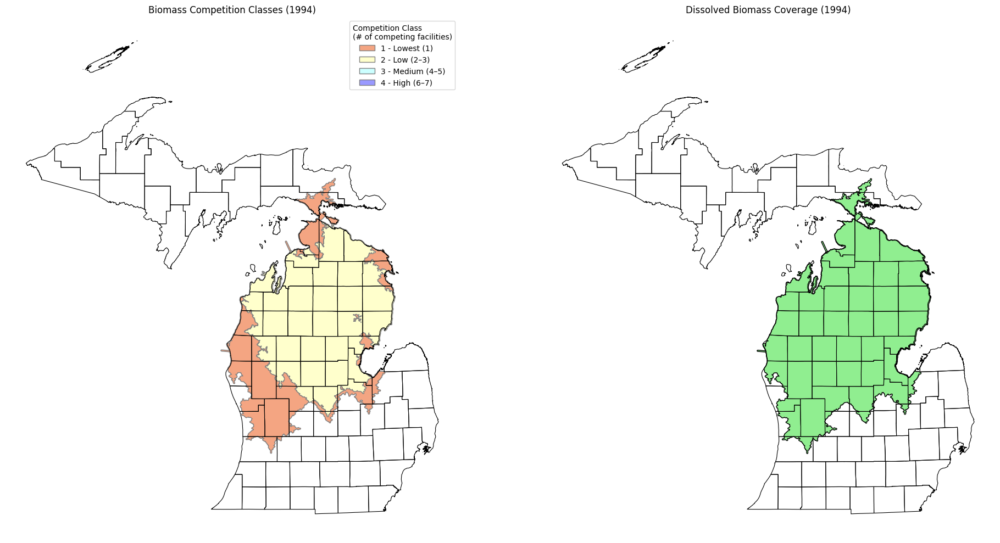

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_1994_fp   = os.path.join(base_path, "biomass_hotspots_1994.shp")   # UNDISSOLVED
dissolved_1994_fp = os.path.join(base_path, "biomass_coverage_1994.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_1994_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_1994_fp)  # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (updated year tag for 1994) ---
color_map = {
    "1 - Lowest (1994)": "#F4A582",
    "2 - Low (1994)":    "#FFFFCC",
    "3 - Medium (1994)": "#CCFFFF",
    "4 - High (1994)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (1994)")
axes[0].axis("off")

# Right: dissolved biomass area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (1994)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for biomass 1994 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_hotspots_1994.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (1994)' has a forest area of 1651467.98 acres.
Polygon '2 - Low (1994)' has a forest area of 5117883.45 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/biomass_hotspots_1994.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (1994)' has a forest area of 1866214.18 acres.
   White/Red/Jack Pine Group: 300618.68 acres
   Spruce/Fir Group: 236216.94 acres
   Oak/Hickory Group: 741.32 acres
   Elm/Ash/Cottonwood Group: 92.66 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 1328451.92 acres

Polygon '2 - Low (1994)' has a forest area of 6160188.65 acres.
   White/Red/Jack Pine Group: 1369502.24 acres
   Spruce/Fir Group: 513839.40 acres
   Oak/Hickory Group: 308.88 acres
   Elm/Ash/Cottonwood Group: 1467.19 acres
   Aspen/Birch Group: 4275070.94 acres



# 2002

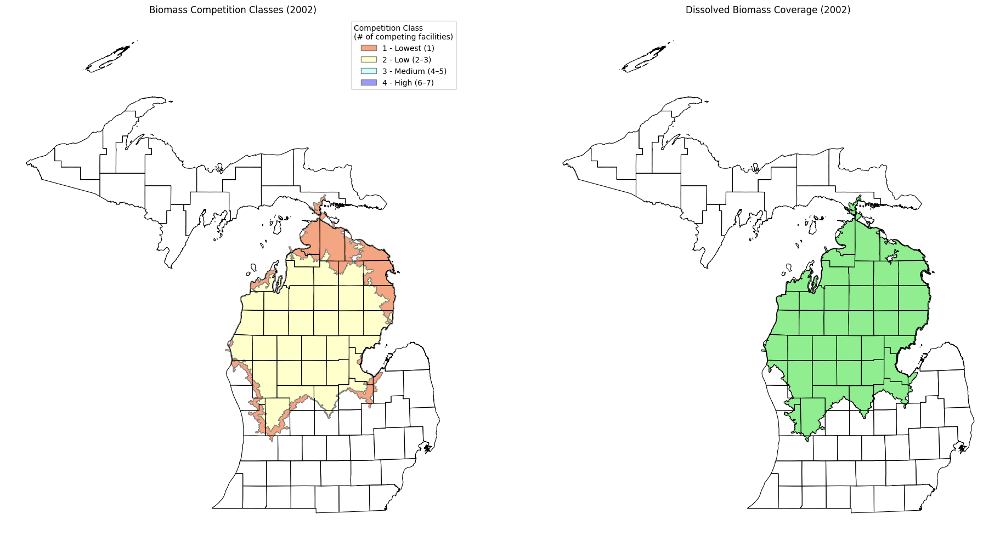

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_2002_fp   = os.path.join(base_path, "biomass_hotspots_2002.shp")   # UNDISSOLVED
dissolved_2002_fp = os.path.join(base_path, "biomass_coverage_2002.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_2002_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_2002_fp)  # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (updated year tag for 2002) ---
color_map = {
    "1 - Lowest (2002)": "#F4A582",
    "2 - Low (2002)":    "#FFFFCC",
    "3 - Medium (2002)": "#CCFFFF",
    "4 - High (2002)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (2002)")
axes[0].axis("off")

# Right: dissolved biomass area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (2002)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for biomass 2002 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_hotspots_2002.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (2002)' has a forest area of 1135885.25 acres.
Polygon '2 - Low (2002)' has a forest area of 5248847.79 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/biomass_hotspots_2002.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (2002)' has a forest area of 1536483.45 acres.
   White/Red/Jack Pine Group: 148726.32 acres
   Spruce/Fir Group: 310564.65 acres
   Oak/Hickory Group: 525.10 acres
   Elm/Ash/Cottonwood Group: 77.22 acres
   Maple/Beech/Birch Group: 61.78 acres
   Aspen/Birch Group: 1076528.38 acres

Polygon '2 - Low (2002)' has a forest area of 6042798.33 acres.
   White/Red/Jack Pine Group: 1484328.85 acres
   Spruce/Fir Group: 355645.87 acres
   Oak/Hickory Group: 416.99 acres
   Elm/Ash/Cottonwood Group: 1482.63 acres
   Maple/Beech/Birch Group: 30.89 acres
   Aspen/Birch Group: 4200893.11 acres



# 2018

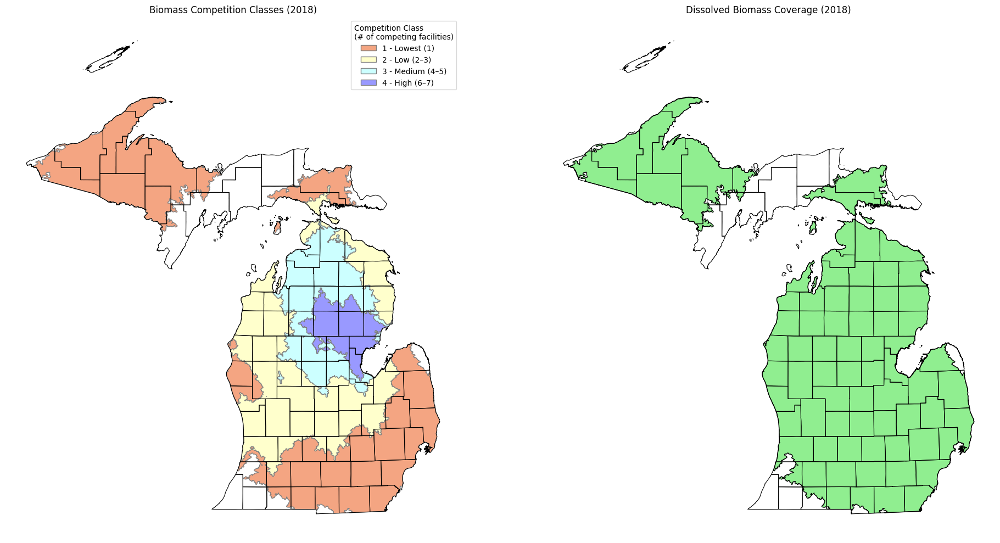

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_2018_fp   = os.path.join(base_path, "biomass_hotspots_2018.shp")   # UNDISSOLVED
dissolved_2018_fp = os.path.join(base_path, "biomass_coverage_2018.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_2018_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_2018_fp)  # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (updated year tag for 2018) ---
color_map = {
    "1 - Lowest (2018)": "#F4A582",
    "2 - Low (2018)":    "#FFFFCC",
    "3 - Medium (2018)": "#CCFFFF",
    "4 - High (2018)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (2018)")
axes[0].axis("off")

# Right: dissolved biomass area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (2018)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for biomass 2018 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_hotspots_2018.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (2018)' has a forest area of 6485154.17 acres.
Polygon '2 - Low (2018)' has a forest area of 3629353.92 acres.
Polygon '3 - Medium (2018)' has a forest area of 2581306.27 acres.
Polygon '4 - High (2018)' has a forest area of 989406.22 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/biomass_hotspots_2018.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (2018)' has a forest area of 7156546.90 acres.
   White/Red/Jack Pine Group: 353684.48 acres
   Spruce/Fir Group: 1156621.28 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 68587.08 acres
   Elm/Ash/Cottonwood Group: 94672.10 acres
   Maple/Beech/Birch Group: 3416859.83 acres
   Aspen/Birch Group: 2065983.13 acres

Polygon '2 - Low (2018)' has a forest area of 3886822.65 acres.
   White/Red/Jack Pine Group: 732264.78 acres
   Spruce/Fir Group: 349730.80 acres
   Oak/Hickory Group: 6718.17 acres
   Elm/Ash/Cottonwood Group: 5791.52 acres
   Maple/Beech/Birch Group: 8772.23 acres
   Aspen/Birch Group: 2783545.16 acres

Polygon '3 - Medium (2018)' has a forest area of 2983375.89 acres.
   White/Red/Jack Pine Group: 589252.76 acres
   Spruce/Fir Group: 286394.70 acres
   Oak/Hickory Group: 247.11 acres
   Elm/Ash/Cottonwood Group: 1127.42 acres
   Maple/Beech/Birch Group: 61.78 acres
   Aspen/Birch Group: 2106292.13 acres

Polygon '4 - High (2018)' h

# 2023

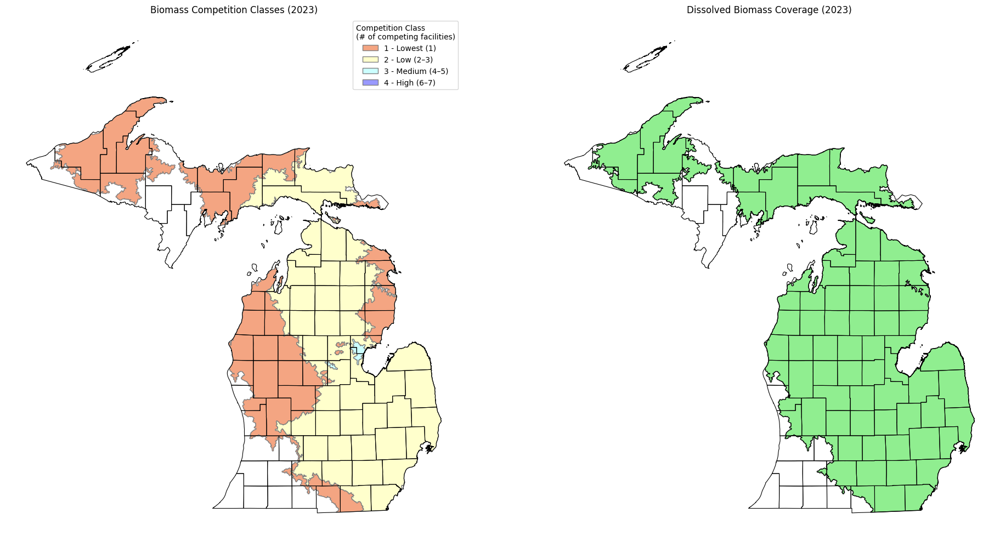

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_2023_fp   = os.path.join(base_path, "biomass_hotspots_2023.shp")   # UNDISSOLVED
dissolved_2023_fp = os.path.join(base_path, "biomass_coverage_2023.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_2023_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_2023_fp)  # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (updated year tag for 2023) ---
color_map = {
    "1 - Lowest (2023)": "#F4A582",
    "2 - Low (2023)":    "#FFFFCC",
    "3 - Medium (2023)": "#CCFFFF",
    "4 - High (2023)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (2023)")
axes[0].axis("off")

# Right: dissolved biomass area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (2023)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for biomass 2023 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_hotspots_2023.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (2023)' has a forest area of 6535627.71 acres.
Polygon '2 - Low (2023)' has a forest area of 6417000.70 acres.
Polygon '3 - Medium (2023)' has a forest area of 22649.10 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/biomass_hotspots_2023.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (2023)' has a forest area of 8073476.34 acres.
   White/Red/Jack Pine Group: 1187339.53 acres
   Spruce/Fir Group: 1239833.89 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 18455.65 acres
   Elm/Ash/Cottonwood Group: 37760.73 acres
   Maple/Beech/Birch Group: 2581552.27 acres
   Aspen/Birch Group: 3008395.27 acres

Polygon '2 - Low (2023)' has a forest area of 7020237.61 acres.
   White/Red/Jack Pine Group: 1070566.97 acres
   Spruce/Fir Group: 1105285.22 acres
   Oak/Hickory Group: 12509.69 acres
   Elm/Ash/Cottonwood Group: 3088.81 acres
   Maple/Beech/Birch Group: 1003.86 acres
   Aspen/Birch Group: 4827783.05 acres

Polygon '3 - Medium (2023)' has a forest area of 25529.04 acres.
   White/Red/Jack Pine Group: 602.32 acres
   Spruce/Fir Group: 741.32 acres
   Aspen/Birch Group: 24185.40 acres



# Pulpwood

# 1985

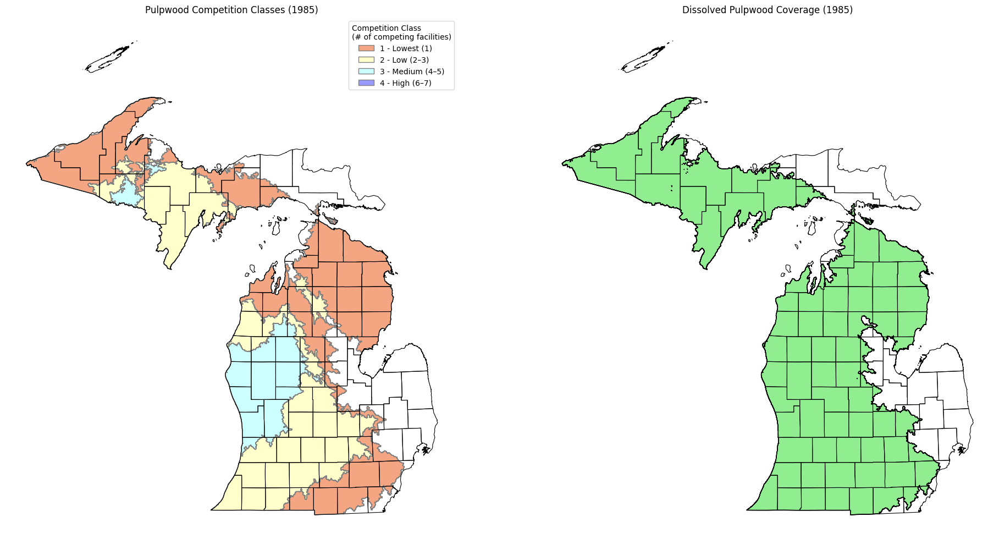

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp        = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_1985_fp   = os.path.join(base_path, "pulpwood_hotspots_1985.shp")    # UNDISSOLVED
dissolved_1985_fp  = os.path.join(base_path, "pulpwood_coverage_1985.shp")    # DISSOLVED

# --- Load data ---
gdf_mi     = gpd.read_file(michigan_fp)
gdf_pulp   = gpd.read_file(pulpwood_1985_fp)    # original polygons with classes
gdf_union  = gpd.read_file(dissolved_1985_fp)   # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map for pulpwood competition classes (1985) ---
color_map = {
    "1 - Lowest (1985)": "#F4A582",
    "2 - Low (1985)":    "#FFFFCC",
    "3 - Medium (1985)": "#CCFFFF",
    "4 - High (1985)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (1985)")
axes[0].axis("off")

# Right: dissolved pulpwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (1985)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for pulpwood hotspots 1985 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "pulpwood_hotspots_1985.shp")  # <-- switched to pulpwood 1985

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (1985)' has a forest area of 7073671.84 acres.
Polygon '2 - Low (1985)' has a forest area of 3970397.67 acres.
Polygon '3 - Medium (1985)' has a forest area of 1898004.29 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/pulpwood_hotspots_1985.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (1985)' has a forest area of 8632736.73 acres.
   White/Red/Jack Pine Group: 1120374.07 acres
   Spruce/Fir Group: 1197671.60 acres
   Exotic Softwoods Group: 123.55 acres
   Oak/Hickory Group: 32756.86 acres
   Elm/Ash/Cottonwood Group: 36756.87 acres
   Maple/Beech/Birch Group: 2398154.03 acres
   Aspen/Birch Group: 3846899.75 acres

Polygon '2 - Low (1985)' has a forest area of 4991397.45 acres.
   White/Red/Jack Pine Group: 441360.42 acres
   Spruce/Fir Group: 1103709.93 acres
   Exotic Softwoods Group: 15.44 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 114270.62 acres
   Elm/Ash/Cottonwood Group: 141235.95 acres
   Maple/Beech/Birch Group: 1286953.73 acres
   Aspen/Birch Group: 1903820.47 acres

Polygon '3 - Medium (1985)' has a forest area of 1926276.14 acres.
   White/Red/Jack Pine Group: 466287.14 acres
   Spruce/Fir Group: 99119.99 acres
   Oak/Hickory Group: 231.66 acres
   Elm/Ash/Cottonwood Group: 926.64 acres
   Maple/Beech/Birch Group: 15

# 1994

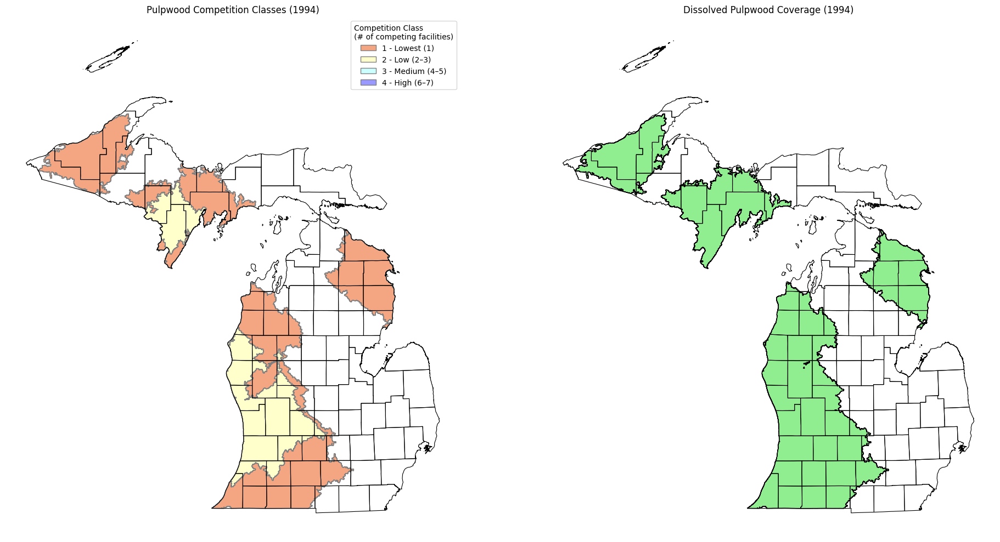

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp        = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_1994_fp   = os.path.join(base_path, "pulpwood_hotspots_1994.shp")   # UNDISSOLVED
dissolved_1994_fp  = os.path.join(base_path, "pulpwood_coverage_1994.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_pulp  = gpd.read_file(pulpwood_1994_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_1994_fp)   # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map for pulpwood competition classes (1994) ---
color_map = {
    "1 - Lowest (1994)": "#F4A582",
    "2 - Low (1994)":    "#FFFFCC",
    "3 - Medium (1994)": "#CCFFFF",
    "4 - High (1994)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (1994)")
axes[0].axis("off")

# Right: dissolved pulpwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (1994)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for pulpwood hotspots 1994 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "pulpwood_hotspots_1994.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (1994)' has a forest area of 5668914.76 acres.
Polygon '2 - Low (1994)' has a forest area of 1800567.03 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/pulpwood_hotspots_1994.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (1994)' has a forest area of 7037550.40 acres.
   White/Red/Jack Pine Group: 857438.91 acres
   Spruce/Fir Group: 946381.26 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 106641.25 acres
   Elm/Ash/Cottonwood Group: 127521.62 acres
   Maple/Beech/Birch Group: 2213257.71 acres
   Aspen/Birch Group: 2786139.76 acres

Polygon '2 - Low (1994)' has a forest area of 2175527.86 acres.
   White/Red/Jack Pine Group: 233437.00 acres
   Spruce/Fir Group: 441839.18 acres
   Oak/Hickory Group: 15382.29 acres
   Elm/Ash/Cottonwood Group: 34007.83 acres
   Maple/Beech/Birch Group: 319012.56 acres
   Aspen/Birch Group: 1131849.01 acres



# 2002

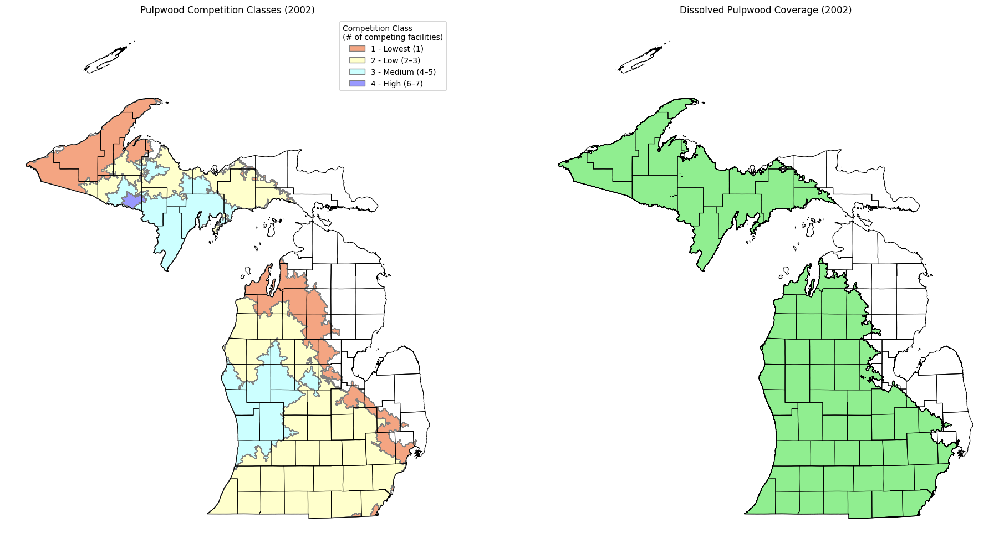

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp        = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_2002_fp   = os.path.join(base_path, "pulpwood_hotspots_2002.shp")   # UNDISSOLVED
dissolved_2002_fp  = os.path.join(base_path, "pulpwood_coverage_2002.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_pulp  = gpd.read_file(pulpwood_2002_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_2002_fp)   # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map for pulpwood competition classes (2002) ---
color_map = {
    "1 - Lowest (2002)": "#F4A582",
    "2 - Low (2002)":    "#FFFFCC",
    "3 - Medium (2002)": "#CCFFFF",
    "4 - High (2002)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (2002)")
axes[0].axis("off")

# Right: dissolved pulpwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (2002)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for pulpwood hotspots 2002 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "pulpwood_hotspots_2002.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (2002)' has a forest area of 3551544.98 acres.
Polygon '2 - Low (2002)' has a forest area of 5340129.39 acres.
Polygon '3 - Medium (2002)' has a forest area of 2392793.13 acres.
Polygon '4 - High (2002)' has a forest area of 85372.36 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/pulpwood_hotspots_2002.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (2002)' has a forest area of 4051904.24 acres.
   White/Red/Jack Pine Group: 371275.26 acres
   Spruce/Fir Group: 281900.47 acres
   Exotic Softwoods Group: 123.55 acres
   Oak/Hickory Group: 3474.91 acres
   Elm/Ash/Cottonwood Group: 12695.02 acres
   Maple/Beech/Birch Group: 1978538.85 acres
   Aspen/Birch Group: 1403896.17 acres

Polygon '2 - Low (2002)' has a forest area of 5626333.75 acres.
   White/Red/Jack Pine Group: 817392.45 acres
   Spruce/Fir Group: 837485.18 acres
   Exotic Softwoods Group: 15.44 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 144355.65 acres
   Elm/Ash/Cottonwood Group: 132710.83 acres
   Maple/Beech/Birch Group: 973362.04 acres
   Aspen/Birch Group: 2720981.26 acres

Polygon '3 - Medium (2002)' has a forest area of 3359531.47 acres.
   White/Red/Jack Pine Group: 294302.05 acres
   Spruce/Fir Group: 891462.18 acres
   Oak/Hickory Group: 5637.08 acres
   Elm/Ash/Cottonwood Group: 33204.73 acres
   Maple/Beech/Birch Group: 932

# 2018

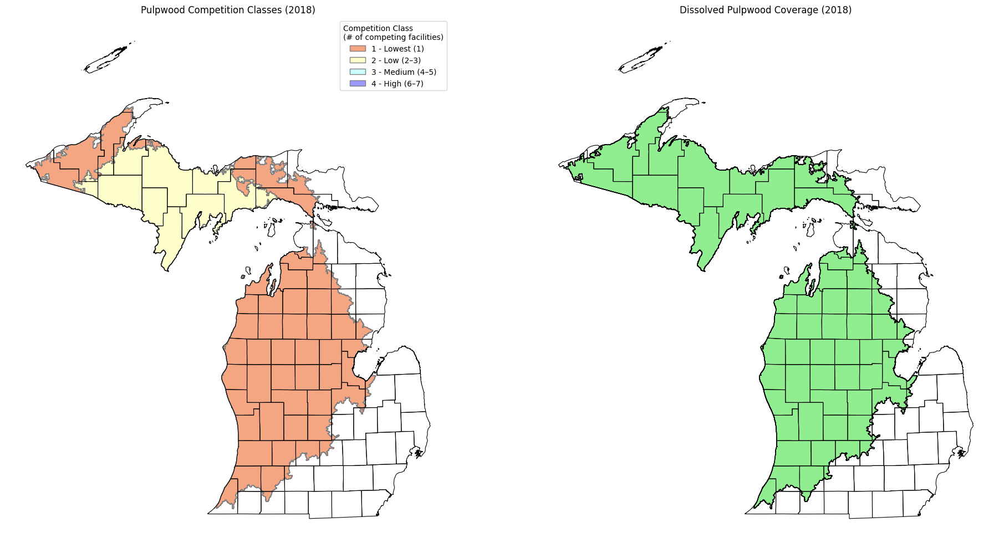

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp        = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_2018_fp   = os.path.join(base_path, "pulpwood_hotspots_2018.shp")   # UNDISSOLVED
dissolved_2018_fp  = os.path.join(base_path, "pulpwood_coverage_2018.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_pulp  = gpd.read_file(pulpwood_2018_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_2018_fp)   # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map for pulpwood competition classes (2018) ---
color_map = {
    "1 - Lowest (2018)": "#F4A582",
    "2 - Low (2018)":    "#FFFFCC",
    "3 - Medium (2018)": "#CCFFFF",
    "4 - High (2018)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (2018)")
axes[0].axis("off")

# Right: dissolved pulpwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (2018)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for pulpwood hotspots 2018 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "pulpwood_hotspots_2018.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (2018)' has a forest area of 8296455.29 acres.
Polygon '2 - Low (2018)' has a forest area of 2992436.76 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/pulpwood_hotspots_2018.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (2018)' has a forest area of 9387935.94 acres.
   White/Red/Jack Pine Group: 1641518.52 acres
   Spruce/Fir Group: 895925.51 acres
   Exotic Softwoods Group: 123.55 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 38146.83 acres
   Elm/Ash/Cottonwood Group: 59058.10 acres
   Maple/Beech/Birch Group: 1452622.19 acres
   Aspen/Birch Group: 5300510.36 acres

Polygon '2 - Low (2018)' has a forest area of 5010578.97 acres.
   White/Red/Jack Pine Group: 290502.82 acres
   Spruce/Fir Group: 1603788.67 acres
   Exotic Softwoods Group: 15.44 acres
   Oak/Hickory Group: 11922.82 acres
   Elm/Ash/Cottonwood Group: 40911.32 acres
   Maple/Beech/Birch Group: 2203110.96 acres
   Aspen/Birch Group: 860326.95 acres



# 2023

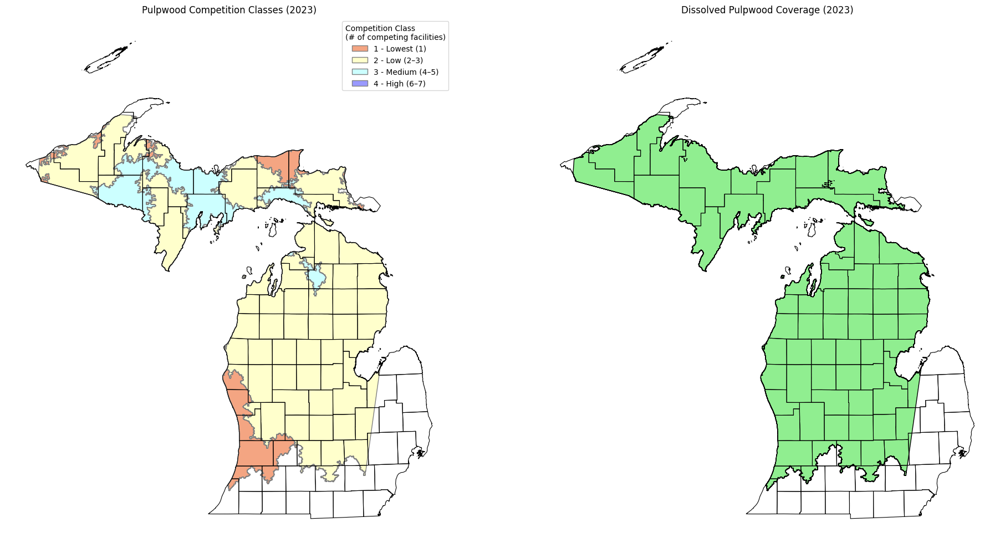

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp        = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_2023_fp   = os.path.join(base_path, "pulpwood_hotspots_2023.shp")   # UNDISSOLVED
dissolved_2023_fp  = os.path.join(base_path, "pulpwood_coverage_2023.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_pulp  = gpd.read_file(pulpwood_2023_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_2023_fp)   # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map for pulpwood competition classes (2023) ---
color_map = {
    "1 - Lowest (2023)": "#F4A582",
    "2 - Low (2023)":    "#FFFFCC",
    "3 - Medium (2023)": "#CCFFFF",
    "4 - High (2023)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (2023)")
axes[0].axis("off")

# Right: dissolved pulpwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (2023)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for pulpwood hotspots 2023 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "pulpwood_hotspots_2023.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (2023)' has a forest area of 1098390.87 acres.
Polygon '2 - Low (2023)' has a forest area of 10581838.55 acres.
Polygon '3 - Medium (2023)' has a forest area of 1825382.25 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/pulpwood_hotspots_2023.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (2023)' has a forest area of 1279571.47 acres.
   White/Red/Jack Pine Group: 217792.17 acres
   Spruce/Fir Group: 218255.49 acres
   Oak/Hickory Group: 11320.50 acres
   Elm/Ash/Cottonwood Group: 19737.51 acres
   Maple/Beech/Birch Group: 249684.16 acres
   Aspen/Birch Group: 562781.64 acres

Polygon '2 - Low (2023)' has a forest area of 13203360.69 acres.
   White/Red/Jack Pine Group: 2004284.10 acres
   Spruce/Fir Group: 2097072.03 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 4509.67 acres
   Elm/Ash/Cottonwood Group: 31073.45 acres
   Maple/Beech/Birch Group: 2251250.10 acres
   Aspen/Birch Group: 6815032.35 acres

Polygon '3 - Medium (2023)' has a forest area of 2839066.57 acres.
   White/Red/Jack Pine Group: 185390.53 acres
   Spruce/Fir Group: 837855.83 acres
   Oak/Hickory Group: 9467.21 acres
   Elm/Ash/Cottonwood Group: 18023.22 acres
   Maple/Beech/Birch Group: 1207571.25 acres
   Aspen/Birch Group: 580758.53 acres



# Hardwood Sawlogs

# 1985

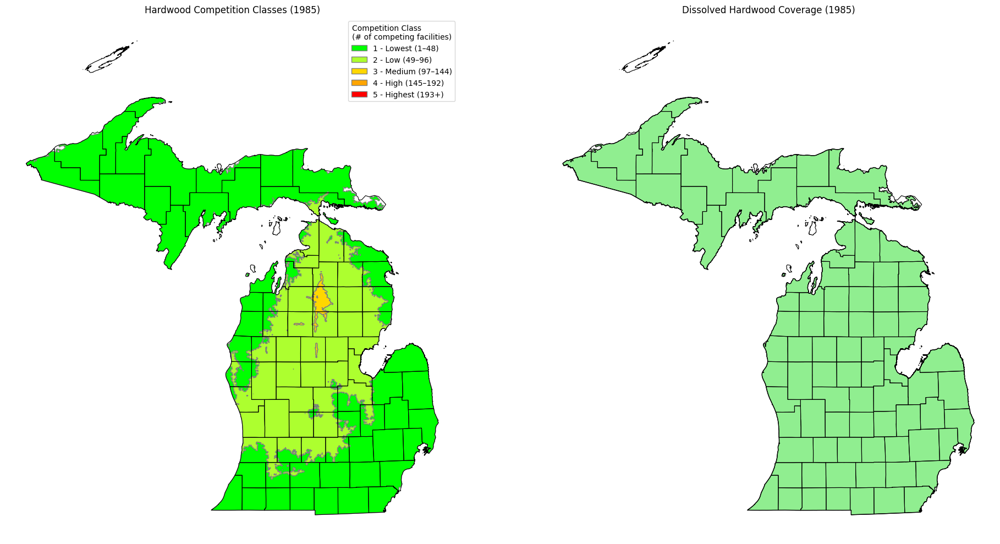

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
hardwood_1985_fp  = os.path.join(base_path, "hardwood_hotspots_1985.shp")   # UNDISSOLVED
dissolved_1985_fp = os.path.join(base_path, "hardwood_coverage_1985.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_hw    = gpd.read_file(hardwood_1985_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_1985_fp)   # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_hw.crs != gdf_mi.crs:
    gdf_hw = gdf_hw.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# ✅ Color map
color_map = {
    "1 - Lowest (1985)": "#00FF00",   # Bright Green
    "2 - Low (1985)":    "#ADFF2F",   # Green Yellow
    "3 - Medium (1985)": "#FFD700",   # Gold
    "4 - High (1985)":   "#FFA500",   # Orange
    "5 - Highest (1985)": "#FF0000"   # Red
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_hw[gdf_hw["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# ✅ Legend
legend_elements = [
    Patch(facecolor='#00FF00', edgecolor='grey', label='1 - Lowest (1–48)'),
    Patch(facecolor='#ADFF2F', edgecolor='grey', label='2 - Low (49–96)'),
    Patch(facecolor='#FFD700', edgecolor='grey', label='3 - Medium (97–144)'),
    Patch(facecolor='#FFA500', edgecolor='grey', label='4 - High (145–192)'),
    Patch(facecolor='#FF0000', edgecolor='grey', label='5 - Highest (193+)')
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)

axes[0].set_title("Hardwood Competition Classes (1985)")
axes[0].axis("off")

# Right: dissolved hardwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Hardwood Coverage (1985)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for hardwood hotspots 1985 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "hardwood_hotspots_1985.shp")  # <-- year & product updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (1985)' has a forest area of 9852058.56 acres.
Polygon '2 - Low (1985)' has a forest area of 5520890.76 acres.
Polygon '3 - Medium (1985)' has a forest area of 189849.51 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/hardwood_hotspots_1985.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (1985)' has a forest area of 12416748.26 acres.
   White/Red/Jack Pine Group: 1070891.29 acres
   Spruce/Fir Group: 2727467.77 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 147120.14 acres
   Elm/Ash/Cottonwood Group: 174209.03 acres
   Maple/Beech/Birch Group: 4006313.37 acres
   Aspen/Birch Group: 4290576.78 acres

Polygon '2 - Low (1985)' has a forest area of 6086427.81 acres.
   White/Red/Jack Pine Group: 1269084.95 acres
   Spruce/Fir Group: 453453.12 acres
   Oak/Hickory Group: 7104.27 acres
   Elm/Ash/Cottonwood Group: 5389.98 acres
   Maple/Beech/Birch Group: 6733.61 acres
   Aspen/Birch Group: 4344661.89 acres

Polygon '3 - Medium (1985)' has a forest area of 218487.15 acres.
   White/Red/Jack Pine Group: 82378.63 acres
   Spruce/Fir Group: 18100.44 acres
   Aspen/Birch Group: 118008.08 acres



# 1994

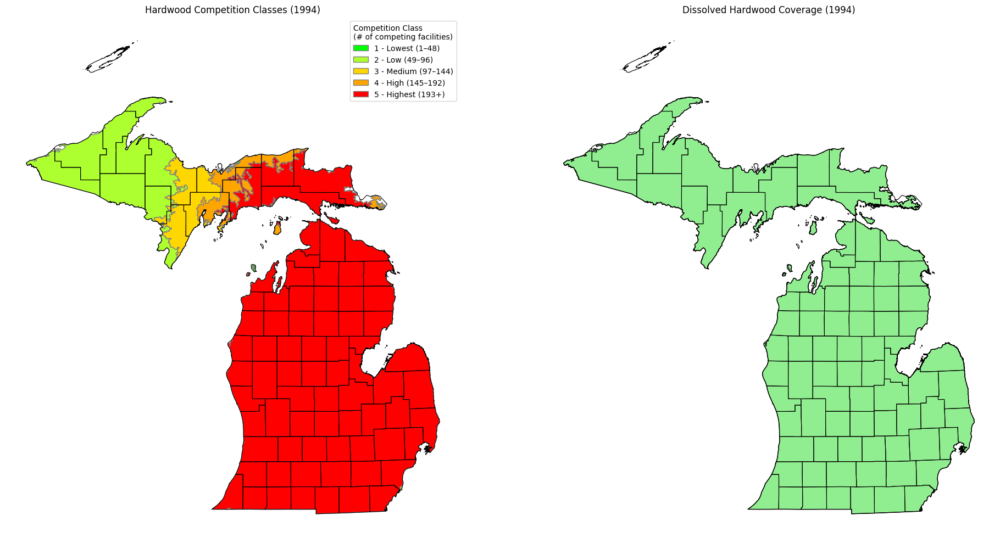

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
hardwood_1994_fp  = os.path.join(base_path, "hardwood_hotspots_1994.shp")   # UNDISSOLVED
dissolved_1994_fp = os.path.join(base_path, "hardwood_coverage_1994.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_hw    = gpd.read_file(hardwood_1994_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_1994_fp)   # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_hw.crs != gdf_mi.crs:
    gdf_hw = gdf_hw.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# ✅ Color map
color_map = {
    "1 - Lowest (1994)": "#00FF00",   # Bright Green
    "2 - Low (1994)":    "#ADFF2F",   # Green Yellow
    "3 - Medium (1994)": "#FFD700",   # Gold
    "4 - High (1994)":   "#FFA500",   # Orange
    "5 - Highest (1994)": "#FF0000"   # Red
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_hw[gdf_hw["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# ✅ Legend
legend_elements = [
    Patch(facecolor='#00FF00', edgecolor='grey', label='1 - Lowest (1–48)'),
    Patch(facecolor='#ADFF2F', edgecolor='grey', label='2 - Low (49–96)'),
    Patch(facecolor='#FFD700', edgecolor='grey', label='3 - Medium (97–144)'),
    Patch(facecolor='#FFA500', edgecolor='grey', label='4 - High (145–192)'),
    Patch(facecolor='#FF0000', edgecolor='grey', label='5 - Highest (193+)')
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)

axes[0].set_title("Hardwood Competition Classes (1994)")
axes[0].axis("off")

# Right: dissolved hardwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Hardwood Coverage (1994)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for hardwood hotspots 1994 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "hardwood_hotspots_1994.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (1994)' has a forest area of 12267.28 acres.
Polygon '2 - Low (1994)' has a forest area of 3562274.85 acres.
Polygon '3 - Medium (1994)' has a forest area of 671294.24 acres.
Polygon '4 - High (1994)' has a forest area of 619647.79 acres.
Polygon '5 - Highest (1994)' has a forest area of 10737275.62 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/hardwood_hotspots_1994.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (1994)' has a forest area of 13374.56 acres.
   White/Red/Jack Pine Group: 1389.97 acres
   Spruce/Fir Group: 1343.63 acres
   Maple/Beech/Birch Group: 231.66 acres
   Aspen/Birch Group: 10409.30 acres

Polygon '2 - Low (1994)' has a forest area of 4680307.70 acres.
   White/Red/Jack Pine Group: 113467.53 acres
   Spruce/Fir Group: 746921.19 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 4972.99 acres
   Elm/Ash/Cottonwood Group: 24509.73 acres
   Maple/Beech/Birch Group: 3144982.56 acres
   Aspen/Birch Group: 645314.71 acres

Polygon '3 - Medium (1994)' has a forest area of 1332451.94 acres.
   White/Red/Jack Pine Group: 56448.05 acres
   Spruce/Fir Group: 531414.75 acres
   Oak/Hickory Group: 3969.12 acres
   Elm/Ash/Cottonwood Group: 17359.13 acres
   Maple/Beech/Birch Group: 562719.86 acres
   Aspen/Birch Group: 160541.03 acres

Polygon '4 - High (1994)' has a forest area of 1034644.08 acres.
   White/Red/Jack Pine Group: 227691.81 acres
   

# 2002

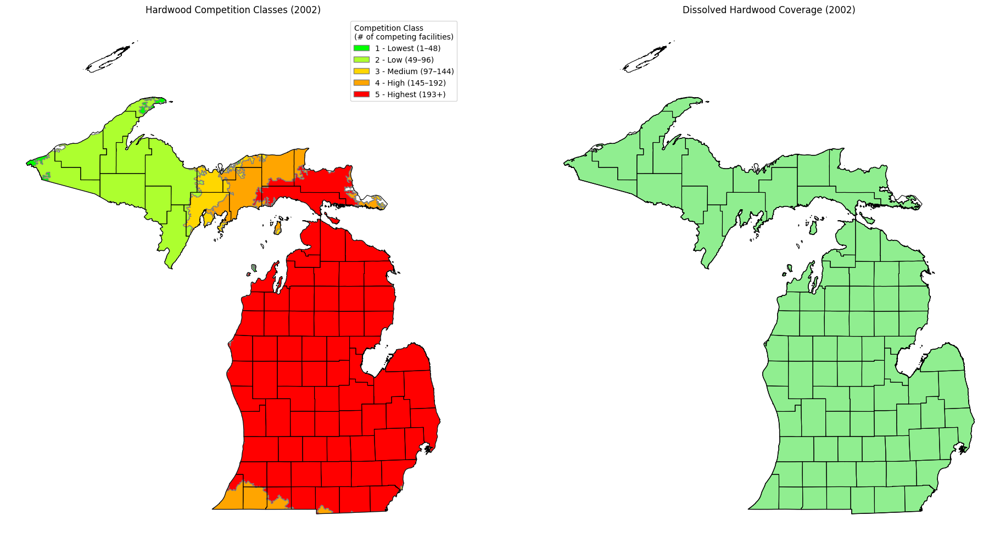

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
hardwood_2002_fp  = os.path.join(base_path, "hardwood_hotspots_2002.shp")   # UNDISSOLVED
dissolved_2002_fp = os.path.join(base_path, "hardwood_coverage_2002.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_hw    = gpd.read_file(hardwood_2002_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_2002_fp)   # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_hw.crs != gdf_mi.crs:
    gdf_hw = gdf_hw.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# ✅ Color map
color_map = {
    "1 - Lowest (2002)": "#00FF00",   # Bright Green
    "2 - Low (2002)":    "#ADFF2F",   # Green Yellow
    "3 - Medium (2002)": "#FFD700",   # Gold
    "4 - High (2002)":   "#FFA500",   # Orange
    "5 - Highest (2002)": "#FF0000"   # Red
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_hw[gdf_hw["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# ✅ Legend
legend_elements = [
    Patch(facecolor='#00FF00', edgecolor='grey', label='1 - Lowest (1–48)'),
    Patch(facecolor='#ADFF2F', edgecolor='grey', label='2 - Low (49–96)'),
    Patch(facecolor='#FFD700', edgecolor='grey', label='3 - Medium (97–144)'),
    Patch(facecolor='#FFA500', edgecolor='grey', label='4 - High (145–192)'),
    Patch(facecolor='#FF0000', edgecolor='grey', label='5 - Highest (193+)')
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)

axes[0].set_title("Hardwood Competition Classes (2002)")
axes[0].axis("off")

# Right: dissolved hardwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Hardwood Coverage (2002)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for hardwood hotspots 2002 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "hardwood_hotspots_2002.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (2002)' has a forest area of 105959.19 acres.
Polygon '2 - Low (2002)' has a forest area of 3921757.54 acres.
Polygon '3 - Medium (2002)' has a forest area of 471267.96 acres.
Polygon '4 - High (2002)' has a forest area of 993472.93 acres.
Polygon '5 - Highest (2002)' has a forest area of 10109689.02 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/hardwood_hotspots_2002.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (2002)' has a forest area of 136679.95 acres.
   White/Red/Jack Pine Group: 1559.85 acres
   Spruce/Fir Group: 10486.52 acres
   Oak/Hickory Group: 30.89 acres
   Elm/Ash/Cottonwood Group: 1683.40 acres
   Maple/Beech/Birch Group: 110023.50 acres
   Aspen/Birch Group: 12895.79 acres

Polygon '2 - Low (2002)' has a forest area of 5468062.99 acres.
   White/Red/Jack Pine Group: 153807.42 acres
   Spruce/Fir Group: 1114072.89 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 8525.12 acres
   Elm/Ash/Cottonwood Group: 34795.47 acres
   Maple/Beech/Birch Group: 3402728.51 acres
   Aspen/Birch Group: 753994.58 acres

Polygon '3 - Medium (2002)' has a forest area of 835878.99 acres.
   White/Red/Jack Pine Group: 79104.49 acres
   Spruce/Fir Group: 280664.95 acres
   Oak/Hickory Group: 1637.07 acres
   Elm/Ash/Cottonwood Group: 11521.27 acres
   Maple/Beech/Birch Group: 329499.07 acres
   Aspen/Birch Group: 133452.14 acres

Polygon '4 - High (2002)' has a 

# 2018

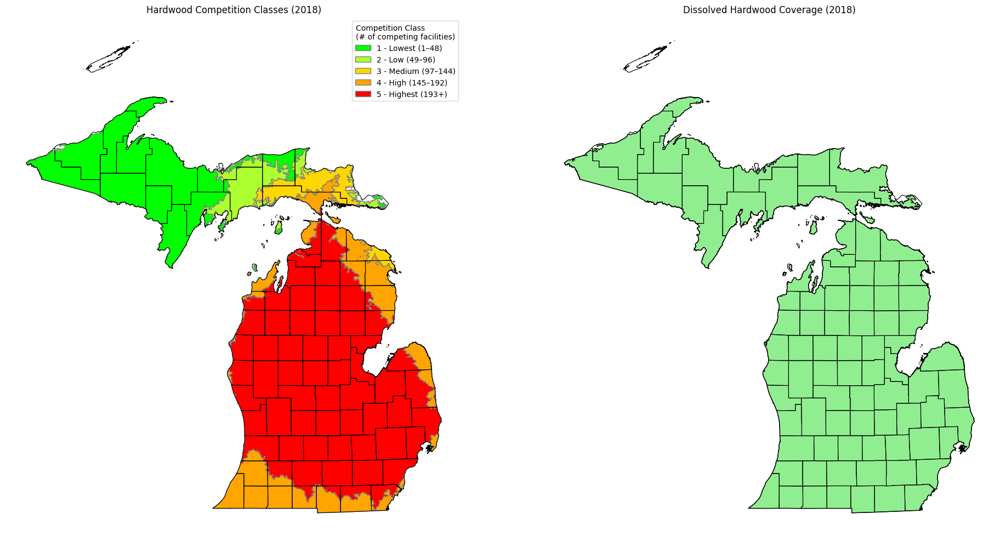

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
hardwood_2018_fp  = os.path.join(base_path, "hardwood_hotspots_2018.shp")   # UNDISSOLVED
dissolved_2018_fp = os.path.join(base_path, "hardwood_coverage_2018.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_hw    = gpd.read_file(hardwood_2018_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_2018_fp)   # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_hw.crs != gdf_mi.crs:
    gdf_hw = gdf_hw.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# ✅ Color map
color_map = {
    "1 - Lowest (2018)": "#00FF00",   # Bright Green
    "2 - Low (2018)":    "#ADFF2F",   # Green Yellow
    "3 - Medium (2018)": "#FFD700",   # Gold
    "4 - High (2018)":   "#FFA500",   # Orange
    "5 - Highest (2018)": "#FF0000"   # Red
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_hw[gdf_hw["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# ✅ Legend
legend_elements = [
    Patch(facecolor='#00FF00', edgecolor='grey', label='1 - Lowest (1–48)'),
    Patch(facecolor='#ADFF2F', edgecolor='grey', label='2 - Low (49–96)'),
    Patch(facecolor='#FFD700', edgecolor='grey', label='3 - Medium (97–144)'),
    Patch(facecolor='#FFA500', edgecolor='grey', label='4 - High (145–192)'),
    Patch(facecolor='#FF0000', edgecolor='grey', label='5 - Highest (193+)')
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)

axes[0].set_title("Hardwood Competition Classes (2018)")
axes[0].axis("off")

# Right: dissolved hardwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Hardwood Coverage (2018)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for hardwood hotspots 2018 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "hardwood_hotspots_2018.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (2018)' has a forest area of 4593496.79 acres.
Polygon '2 - Low (2018)' has a forest area of 750899.24 acres.
Polygon '3 - Medium (2018)' has a forest area of 595757.28 acres.
Polygon '4 - High (2018)' has a forest area of 1619302.17 acres.
Polygon '5 - Highest (2018)' has a forest area of 8038571.96 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/hardwood_hotspots_2018.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (2018)' has a forest area of 6618583.87 acres.
   White/Red/Jack Pine Group: 316433.40 acres
   Spruce/Fir Group: 1494475.60 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 9745.20 acres
   Elm/Ash/Cottonwood Group: 46532.96 acres
   Maple/Beech/Birch Group: 3812258.72 acres
   Aspen/Birch Group: 938999.00 acres

Polygon '2 - Low (2018)' has a forest area of 1337656.59 acres.
   White/Red/Jack Pine Group: 242935.10 acres
   Spruce/Fir Group: 564264.27 acres
   Oak/Hickory Group: 4355.23 acres
   Elm/Ash/Cottonwood Group: 5111.98 acres
   Maple/Beech/Birch Group: 117822.75 acres
   Aspen/Birch Group: 403167.25 acres

Polygon '3 - Medium (2018)' has a forest area of 1030906.62 acres.
   White/Red/Jack Pine Group: 116973.33 acres
   Spruce/Fir Group: 444665.45 acres
   Oak/Hickory Group: 30.89 acres
   Maple/Beech/Birch Group: 77.22 acres
   Aspen/Birch Group: 469159.73 acres

Polygon '4 - High (2018)' has a forest area of 1982863.18 acres.
   White

# 2023

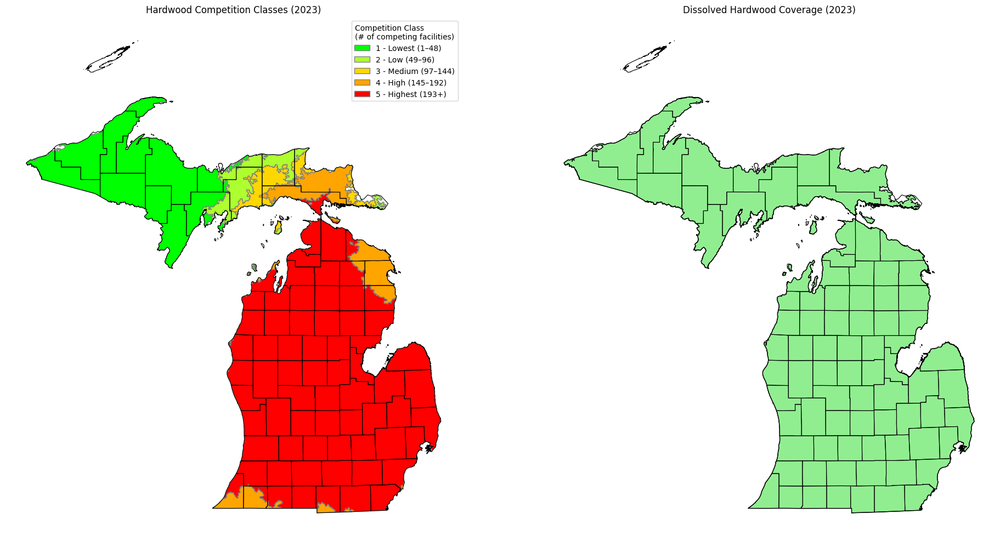

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
hardwood_2023_fp  = os.path.join(base_path, "hardwood_hotspots_2023.shp")   # UNDISSOLVED
dissolved_2023_fp = os.path.join(base_path, "hardwood_coverage_2023.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_hw    = gpd.read_file(hardwood_2023_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_2023_fp)   # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_hw.crs != gdf_mi.crs:
    gdf_hw = gdf_hw.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# ✅ Color map
color_map = {
    "1 - Lowest (2023)": "#00FF00",   # Bright Green
    "2 - Low (2023)":    "#ADFF2F",   # Green Yellow
    "3 - Medium (2023)": "#FFD700",   # Gold
    "4 - High (2023)":   "#FFA500",   # Orange
    "5 - Highest (2023)": "#FF0000"   # Red
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_hw[gdf_hw["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# ✅ Legend
legend_elements = [
    Patch(facecolor='#00FF00', edgecolor='grey', label='1 - Lowest (1–48)'),
    Patch(facecolor='#ADFF2F', edgecolor='grey', label='2 - Low (49–96)'),
    Patch(facecolor='#FFD700', edgecolor='grey', label='3 - Medium (97–144)'),
    Patch(facecolor='#FFA500', edgecolor='grey', label='4 - High (145–192)'),
    Patch(facecolor='#FF0000', edgecolor='grey', label='5 - Highest (193+)')
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)

axes[0].set_title("Hardwood Competition Classes (2023)")
axes[0].axis("off")

# Right: dissolved hardwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Hardwood Coverage (2023)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for hardwood hotspots 2023 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "hardwood_hotspots_2023.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (2023)' has a forest area of 4405215.83 acres.
Polygon '2 - Low (2023)' has a forest area of 635671.09 acres.
Polygon '3 - Medium (2023)' has a forest area of 402680.16 acres.
Polygon '4 - High (2023)' has a forest area of 1033111.41 acres.
Polygon '5 - Highest (2023)' has a forest area of 9126659.96 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/hardwood_hotspots_2023.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (2023)' has a forest area of 6297424.59 acres.
   White/Red/Jack Pine Group: 209575.93 acres
   Spruce/Fir Group: 1361085.23 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 9837.87 acres
   Elm/Ash/Cottonwood Group: 46378.52 acres
   Maple/Beech/Birch Group: 3816521.28 acres
   Aspen/Birch Group: 853886.77 acres

Polygon '2 - Low (2023)' has a forest area of 1083092.10 acres.
   White/Red/Jack Pine Group: 262610.84 acres
   Spruce/Fir Group: 434009.04 acres
   Oak/Hickory Group: 3227.81 acres
   Elm/Ash/Cottonwood Group: 5158.32 acres
   Maple/Beech/Birch Group: 107583.34 acres
   Aspen/Birch Group: 270502.75 acres

Polygon '3 - Medium (2023)' has a forest area of 756542.85 acres.
   White/Red/Jack Pine Group: 96139.29 acres
   Spruce/Fir Group: 330240.39 acres
   Oak/Hickory Group: 1034.75 acres
   Elm/Ash/Cottonwood Group: 108.11 acres
   Maple/Beech/Birch Group: 6362.95 acres
   Aspen/Birch Group: 322657.35 acres

Polygon '4 - High (2023)' has

# Softwood Sawlogs

# 1985

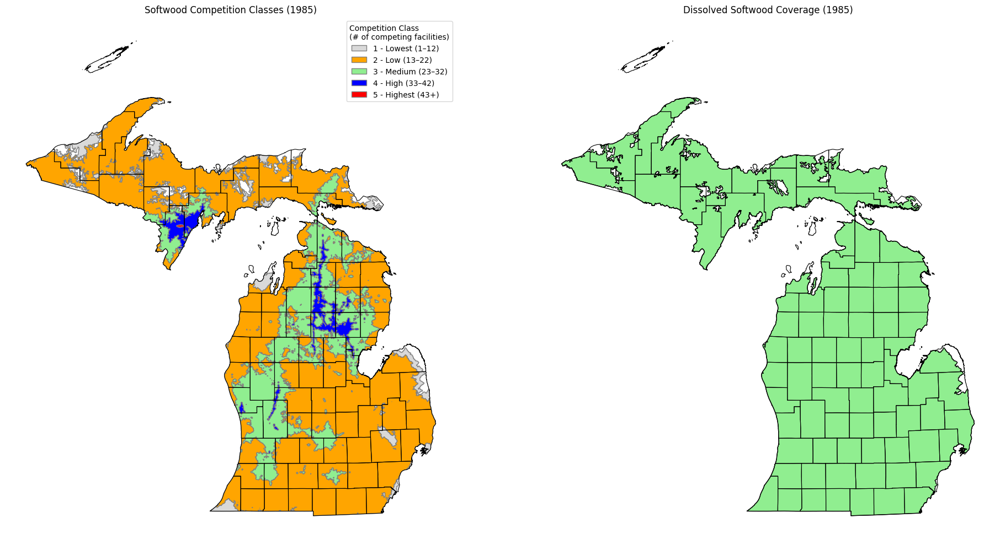

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
michigan_fp        = os.path.join(base_path, "Counties_(v17a).shp")
softwood_1985_fp   = os.path.join(base_path, "softwood_hotspots_1985.shp")   # UNDISSOLVED
dissolved_1985_fp  = os.path.join(base_path, "softwood_coverage_1985.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_sw    = gpd.read_file(softwood_1985_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_1985_fp)   # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_sw.crs != gdf_mi.crs:
    gdf_sw = gdf_sw.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# ✅ Color mapping based on label
label_color_map = {
    "1 - Lowest (1985)": "#D9D9D9",   # Light gray
    "2 - Low (1985)":    "#FFA500",   # Orange
    "3 - Medium (1985)": "#90EE90",   # Light green
    "4 - High (1985)":   "#0000FF",   # Blue
    "5 - Highest (1985)": "#FF0000"   # Red
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in label_color_map.items():
    subset = gdf_sw[gdf_sw["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# ✅ Legend
legend_elements = [
    Patch(facecolor='#D9D9D9', edgecolor='grey', label='1 - Lowest (1–12)'),
    Patch(facecolor='#FFA500', edgecolor='grey', label='2 - Low (13–22)'),
    Patch(facecolor='#90EE90', edgecolor='grey', label='3 - Medium (23–32)'),
    Patch(facecolor='#0000FF', edgecolor='grey', label='4 - High (33–42)'),
    Patch(facecolor='#FF0000', edgecolor='grey', label='5 - Highest (43+)')
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)

axes[0].set_title("Softwood Competition Classes (1985)")
axes[0].axis("off")

# Right: dissolved softwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Softwood Coverage (1985)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for hardwood hotspots 2023 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "hardwood_hotspots_2023.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (2023)' has a forest area of 4405215.83 acres.
Polygon '2 - Low (2023)' has a forest area of 635671.09 acres.
Polygon '3 - Medium (2023)' has a forest area of 402680.16 acres.
Polygon '4 - High (2023)' has a forest area of 1033111.41 acres.
Polygon '5 - Highest (2023)' has a forest area of 9126659.96 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/softwood_hotspots_1985.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (1985)' has a forest area of 949732.62 acres.
   White/Red/Jack Pine Group: 80556.23 acres
   Spruce/Fir Group: 194085.53 acres
   Oak/Hickory Group: 13281.89 acres
   Elm/Ash/Cottonwood Group: 9976.86 acres
   Maple/Beech/Birch Group: 425792.80 acres
   Aspen/Birch Group: 226039.30 acres

Polygon '2 - Low (1985)' has a forest area of 12128515.72 acres.
   White/Red/Jack Pine Group: 1285857.20 acres
   Spruce/Fir Group: 2071697.43 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 124741.69 acres
   Elm/Ash/Cottonwood Group: 127243.63 acres
   Maple/Beech/Birch Group: 3077013.24 acres
   Aspen/Birch Group: 5441792.64 acres

Polygon '3 - Medium (1985)' has a forest area of 4297078.73 acres.
   White/Red/Jack Pine Group: 826535.34 acres
   Spruce/Fir Group: 577777.82 acres
   Oak/Hickory Group: 15320.51 acres
   Elm/Ash/Cottonwood Group: 33683.50 acres
   Maple/Beech/Birch Group: 212139.64 acres
   Aspen/Birch Group: 263

# 1994

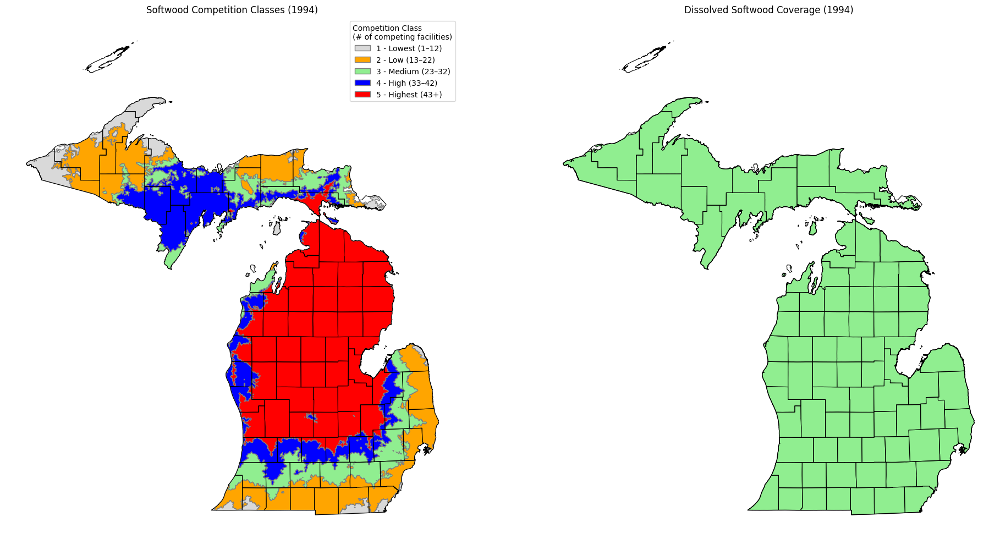

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
michigan_fp        = os.path.join(base_path, "Counties_(v17a).shp")
softwood_1994_fp   = os.path.join(base_path, "softwood_hotspots_1994.shp")   # UNDISSOLVED
dissolved_1994_fp  = os.path.join(base_path, "softwood_coverage_1994.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_sw    = gpd.read_file(softwood_1994_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_1994_fp)   # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_sw.crs != gdf_mi.crs:
    gdf_sw = gdf_sw.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# ✅ Color mapping based on label
label_color_map = {
    "1 - Lowest (1994)": "#D9D9D9",   # Light gray
    "2 - Low (1994)":    "#FFA500",   # Orange
    "3 - Medium (1994)": "#90EE90",   # Light green
    "4 - High (1994)":   "#0000FF",   # Blue
    "5 - Highest (1994)": "#FF0000"   # Red
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in label_color_map.items():
    subset = gdf_sw[gdf_sw["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# ✅ Legend
legend_elements = [
    Patch(facecolor='#D9D9D9', edgecolor='grey', label='1 - Lowest (1–12)'),
    Patch(facecolor='#FFA500', edgecolor='grey', label='2 - Low (13–22)'),
    Patch(facecolor='#90EE90', edgecolor='grey', label='3 - Medium (23–32)'),
    Patch(facecolor='#0000FF', edgecolor='grey', label='4 - High (33–42)'),
    Patch(facecolor='#FF0000', edgecolor='grey', label='5 - Highest (43+)')
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)

axes[0].set_title("Softwood Competition Classes (1994)")
axes[0].axis("off")

# Right: dissolved softwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Softwood Coverage (1994)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for softwood hotspots 1994 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "softwood_hotspots_1994.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (1994)' has a forest area of 1127940.20 acres.
Polygon '2 - Low (1994)' has a forest area of 3101094.26 acres.
Polygon '3 - Medium (1994)' has a forest area of 1827605.75 acres.
Polygon '4 - High (1994)' has a forest area of 2858696.27 acres.
Polygon '5 - Highest (1994)' has a forest area of 6671008.36 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/softwood_hotspots_1994.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (1994)' has a forest area of 1329934.55 acres.
   White/Red/Jack Pine Group: 24015.52 acres
   Spruce/Fir Group: 122656.74 acres
   Exotic Softwoods Group: 123.55 acres
   Oak/Hickory Group: 18486.54 acres
   Elm/Ash/Cottonwood Group: 14640.97 acres
   Maple/Beech/Birch Group: 1061717.52 acres
   Aspen/Birch Group: 88293.71 acres

Polygon '2 - Low (1994)' has a forest area of 3532134.31 acres.
   White/Red/Jack Pine Group: 296294.34 acres
   Spruce/Fir Group: 626967.16 acres
   Exotic Softwoods Group: 15.44 acres
   Oak/Pine Group: 30.89 acres
   Oak/Hickory Group: 85977.10 acres
   Elm/Ash/Cottonwood Group: 68695.19 acres
   Maple/Beech/Birch Group: 1581641.88 acres
   Aspen/Birch Group: 872512.31 acres

Polygon '3 - Medium (1994)' has a forest area of 2278230.88 acres.
   White/Red/Jack Pine Group: 221375.19 acres
   Spruce/Fir Group: 634720.08 acres
   Oak/Hickory Group: 26023.25 acres
   Elm/Ash/Cottonwood Group: 56293.61 acres
   Maple/Beech/Birch Group: 360541

# 2002

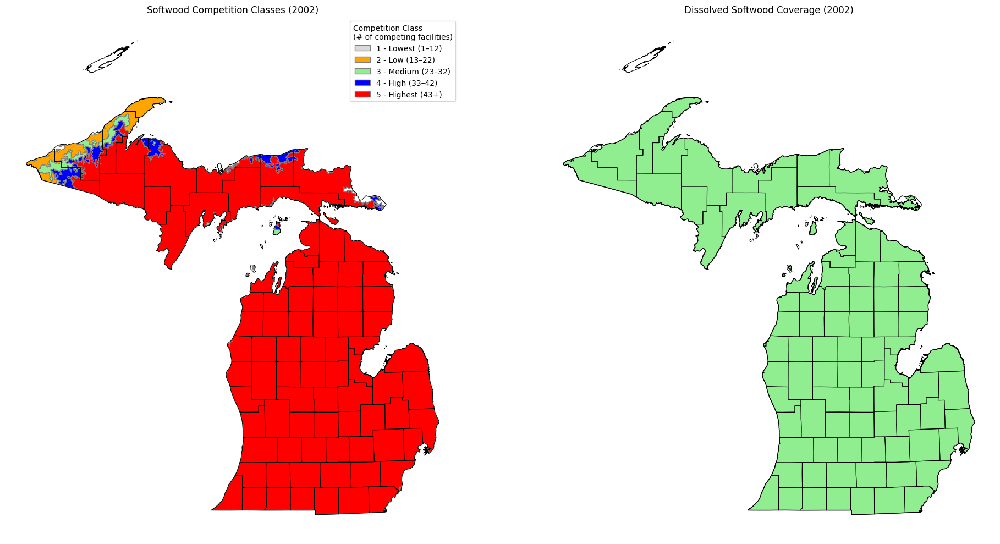

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
michigan_fp        = os.path.join(base_path, "Counties_(v17a).shp")
softwood_2002_fp   = os.path.join(base_path, "softwood_hotspots_2002.shp")   # UNDISSOLVED
dissolved_2002_fp  = os.path.join(base_path, "softwood_coverage_2002.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_sw    = gpd.read_file(softwood_2002_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_2002_fp)   # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_sw.crs != gdf_mi.crs:
    gdf_sw = gdf_sw.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# ✅ Color mapping based on label
label_color_map = {
    "1 - Lowest (2002)": "#D9D9D9",   # Light gray
    "2 - Low (2002)":    "#FFA500",   # Orange
    "3 - Medium (2002)": "#90EE90",   # Light green
    "4 - High (2002)":   "#0000FF",   # Blue
    "5 - Highest (2002)": "#FF0000"   # Red
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in label_color_map.items():
    subset = gdf_sw[gdf_sw["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# ✅ Legend
legend_elements = [
    Patch(facecolor='#D9D9D9', edgecolor='grey', label='1 - Lowest (1–12)'),
    Patch(facecolor='#FFA500', edgecolor='grey', label='2 - Low (13–22)'),
    Patch(facecolor='#90EE90', edgecolor='grey', label='3 - Medium (23–32)'),
    Patch(facecolor='#0000FF', edgecolor='grey', label='4 - High (33–42)'),
    Patch(facecolor='#FF0000', edgecolor='grey', label='5 - Highest (43+)')
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)

axes[0].set_title("Softwood Competition Classes (2002)")
axes[0].axis("off")

# Right: dissolved softwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Softwood Coverage (2002)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for softwood hotspots 2002 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "softwood_hotspots_2002.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (2002)' has a forest area of 7890.33 acres.
Polygon '2 - Low (2002)' has a forest area of 657284.94 acres.
Polygon '3 - Medium (2002)' has a forest area of 345770.07 acres.
Polygon '4 - High (2002)' has a forest area of 557896.84 acres.
Polygon '5 - Highest (2002)' has a forest area of 14027332.04 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/softwood_hotspots_2002.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (2002)' has a forest area of 11459.49 acres.
   White/Red/Jack Pine Group: 1034.75 acres
   Spruce/Fir Group: 2764.49 acres
   Maple/Beech/Birch Group: 216.22 acres
   Aspen/Birch Group: 7444.04 acres

Polygon '2 - Low (2002)' has a forest area of 764264.88 acres.
   White/Red/Jack Pine Group: 3027.04 acres
   Spruce/Fir Group: 35644.90 acres
   Oak/Hickory Group: 1667.96 acres
   Elm/Ash/Cottonwood Group: 4633.22 acres
   Maple/Beech/Birch Group: 699878.58 acres
   Aspen/Birch Group: 19413.19 acres

Polygon '3 - Medium (2002)' has a forest area of 417252.24 acres.
   White/Red/Jack Pine Group: 1559.85 acres
   Spruce/Fir Group: 31397.78 acres
   Exotic Softwoods Group: 30.89 acres
   Oak/Hickory Group: 139.00 acres
   Elm/Ash/Cottonwood Group: 1498.07 acres
   Maple/Beech/Birch Group: 345159.35 acres
   Aspen/Birch Group: 37467.30 acres

Polygon '4 - High (2002)' has a forest area of 702040.75 acres.
   White/Red/Jack Pine Group: 85683.66 acres
   Spruce/Fir Group:

# 2018

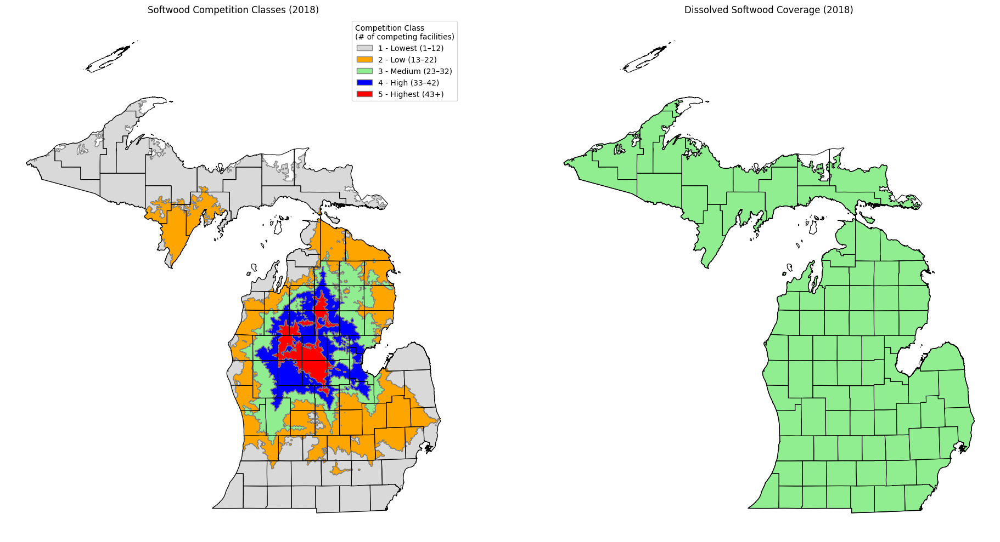

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
michigan_fp        = os.path.join(base_path, "Counties_(v17a).shp")
softwood_2018_fp   = os.path.join(base_path, "softwood_hotspots_2018.shp")   # UNDISSOLVED
dissolved_2018_fp  = os.path.join(base_path, "softwood_coverage_2018.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_sw    = gpd.read_file(softwood_2018_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_2018_fp)   # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_sw.crs != gdf_mi.crs:
    gdf_sw = gdf_sw.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# ✅ Color mapping based on label
label_color_map = {
    "1 - Lowest (2018)": "#D9D9D9",   # Light gray
    "2 - Low (2018)":    "#FFA500",   # Orange
    "3 - Medium (2018)": "#90EE90",   # Light green
    "4 - High (2018)":   "#0000FF",   # Blue
    "5 - Highest (2018)": "#FF0000"   # Red
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in label_color_map.items():
    subset = gdf_sw[gdf_sw["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# ✅ Legend
legend_elements = [
    Patch(facecolor='#D9D9D9', edgecolor='grey', label='1 - Lowest (1–12)'),
    Patch(facecolor='#FFA500', edgecolor='grey', label='2 - Low (13–22)'),
    Patch(facecolor='#90EE90', edgecolor='grey', label='3 - Medium (23–32)'),
    Patch(facecolor='#0000FF', edgecolor='grey', label='4 - High (33–42)'),
    Patch(facecolor='#FF0000', edgecolor='grey', label='5 - Highest (43+)')
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)

axes[0].set_title("Softwood Competition Classes (2018)")
axes[0].axis("off")

# Right: dissolved softwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Softwood Coverage (2018)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for softwood hotspots 2018 (Colab-style)
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "softwood_hotspots_2018.shp")  # <-- year updated

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (2018)' has a forest area of 7503794.14 acres.
Polygon '2 - Low (2018)' has a forest area of 3543410.90 acres.
Polygon '3 - Medium (2018)' has a forest area of 2077626.77 acres.
Polygon '4 - High (2018)' has a forest area of 1559065.28 acres.
Polygon '5 - Highest (2018)' has a forest area of 500334.92 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/softwood_hotspots_2023.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (2023)' has a forest area of 1657796.56 acres.
   White/Red/Jack Pine Group: 27274.21 acres
   Spruce/Fir Group: 114641.28 acres
   Exotic Softwoods Group: 123.55 acres
   Oak/Hickory Group: 1976.84 acres
   Elm/Ash/Cottonwood Group: 8447.90 acres
   Maple/Beech/Birch Group: 1370289.89 acres
   Aspen/Birch Group: 135042.88 acres

Polygon '2 - Low (2023)' has a forest area of 2791174.53 acres.
   White/Red/Jack Pine Group: 201128.03 acres
   Spruce/Fir Group: 703600.60 acres
   Exotic Softwoods Group: 15.44 acres
   Oak/Hickory Group: 1297.30 acres
   Elm/Ash/Cottonwood Group: 22347.56 acres
   Maple/Beech/Birch Group: 1349764.73 acres
   Aspen/Birch Group: 513020.87 acres

Polygon '3 - Medium (2023)' has a forest area of 3576227.11 acres.
   White/Red/Jack Pine Group: 358225.03 acres
   Spruce/Fir Group: 1240405.32 acres
   Oak/Hickory Group: 13683.44 acres
   Elm/Ash/Cottonwood Group: 21142.92 acres
   Maple/Beech/Birch Group: 1208961.21 acres
   Aspen/Birch Group:

# 2023

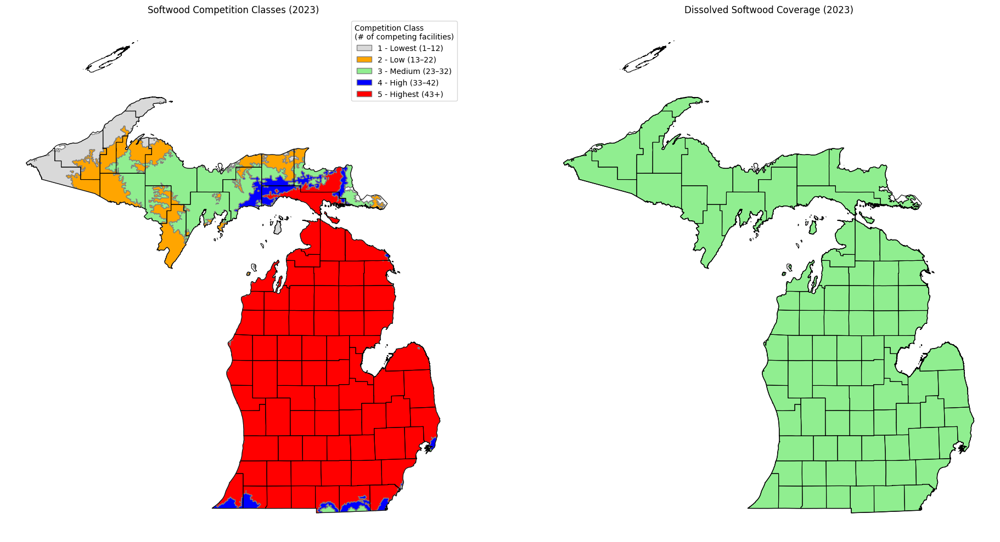

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
michigan_fp        = os.path.join(base_path, "Counties_(v17a).shp")
softwood_2023_fp   = os.path.join(base_path, "softwood_hotspots_2023.shp")   # UNDISSOLVED
dissolved_2023_fp  = os.path.join(base_path, "softwood_coverage_2023.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_sw    = gpd.read_file(softwood_2023_fp)
gdf_union = gpd.read_file(dissolved_2023_fp)

# --- Reproject if needed ---
if gdf_sw.crs != gdf_mi.crs:
    gdf_sw = gdf_sw.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# ✅ Color mapping based on label (2023)
label_color_map = {
    "1 - Lowest (2023)": "#D9D9D9",   # Light gray
    "2 - Low (2023)":    "#FFA500",   # Orange
    "3 - Medium (2023)": "#90EE90",   # Light green
    "4 - High (2023)":   "#0000FF",   # Blue
    "5 - Highest (2023)": "#FF0000"   # Red
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in label_color_map.items():
    subset = gdf_sw[gdf_sw["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# ✅ Legend
legend_elements = [
    Patch(facecolor='#D9D9D9', edgecolor='grey', label='1 - Lowest (1–12)'),
    Patch(facecolor='#FFA500', edgecolor='grey', label='2 - Low (13–22)'),
    Patch(facecolor='#90EE90', edgecolor='grey', label='3 - Medium (23–32)'),
    Patch(facecolor='#0000FF', edgecolor='grey', label='4 - High (33–42)'),
    Patch(facecolor='#FF0000', edgecolor='grey', label='5 - Highest (43+)')
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)

axes[0].set_title("Softwood Competition Classes (2023)")
axes[0].axis("off")

# Right: dissolved softwood area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Softwood Coverage (2023)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths for softwood hotspots 2023
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "softwood_hotspots_2023.shp")  # <-- updated to 2023

# ✅ NLCD / LULC forest codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]

with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        for feature in shp:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:.2f} acres.")


Polygon '1 - Lowest (2023)' has a forest area of 1400228.69 acres.
Polygon '2 - Low (2023)' has a forest area of 1874790.53 acres.
Polygon '3 - Medium (2023)' has a forest area of 2157425.25 acres.
Polygon '4 - High (2023)' has a forest area of 407242.80 acres.
Polygon '5 - Highest (2023)' has a forest area of 9756238.11 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Use the base_path you already defined earlier
clipped_raster_path = f"{base_path}/forest_cover_2019.tif"
shapefile_path = f"{base_path}/softwood_hotspots_2023.shp"

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(clipped_raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("label", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon '1 - Lowest (2023)' has a forest area of 1657796.56 acres.
   White/Red/Jack Pine Group: 27274.21 acres
   Spruce/Fir Group: 114641.28 acres
   Exotic Softwoods Group: 123.55 acres
   Oak/Hickory Group: 1976.84 acres
   Elm/Ash/Cottonwood Group: 8447.90 acres
   Maple/Beech/Birch Group: 1370289.89 acres
   Aspen/Birch Group: 135042.88 acres

Polygon '2 - Low (2023)' has a forest area of 2791174.53 acres.
   White/Red/Jack Pine Group: 201128.03 acres
   Spruce/Fir Group: 703600.60 acres
   Exotic Softwoods Group: 15.44 acres
   Oak/Hickory Group: 1297.30 acres
   Elm/Ash/Cottonwood Group: 22347.56 acres
   Maple/Beech/Birch Group: 1349764.73 acres
   Aspen/Birch Group: 513020.87 acres

Polygon '3 - Medium (2023)' has a forest area of 3576227.11 acres.
   White/Red/Jack Pine Group: 358225.03 acres
   Spruce/Fir Group: 1240405.32 acres
   Oak/Hickory Group: 13683.44 acres
   Elm/Ash/Cottonwood Group: 21142.92 acres
   Maple/Beech/Birch Group: 1208961.21 acres
   Aspen/Birch Group:

# The End